- Credit to Nicky Evans (Nickye17@mit.edu) and acknowledgments to Kangyu Ji for his base code used within https://arxiv.org/abs/2509.09022


In [1]:
import os
import csv
import math
import pickle
import numpy as np
import pandas as pd

np.random.seed(27)

import GPy
from GPy.models import GPRegression
from emukit.model_wrappers import GPyModelWrapper
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import shap
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.cluster import KMeans
from tqdm import trange
from scipy.stats import spearmanr
import itertools

import warnings
warnings.filterwarnings("ignore")

def load_plt_setting():
    plt.style.use('seaborn-v0_8-whitegrid')
    mpl.rcParams['font.sans-serif'] = "Arial"
    mpl.rcParams['font.family'] = "sans-serif"
    mpl.rcParams['axes.linewidth'] = 2
    font = {'size': 32}
    mpl.rc('font', **font)
    mpl.rcParams['xtick.major.pad']='8'
    mpl.rcParams['ytick.major.pad']='8'
    mpl.rcParams["font.weight"] = "normal"
    mpl.rcParams["axes.labelweight"] = "normal"
    mpl.rcParams['svg.fonttype'] = 'none'
    mpl.rcParams['axes.linewidth'] = 2

 /opt/miniconda3/envs/gpy_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning:IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


# 1. Load experimental results

In [ ]:
folder = os.getcwd()

with open(folder + r'/Dataset_Part2-Var-Interaction-Analysis.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter = ',')
    data = []
    for row in csv_reader:
        data.append(row)
        
data = np.array(data)
head_label = data[0,:]
data = np.array(data[1:,:],dtype='float')
data = np.swapaxes(data, 0,-1)

head = ['Temp'+u'(\u00B0C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)', 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)', 'CuCl$_2$ (mmol)', 'NaOH (mmol)', 'H$_2$ (ppm)']

data_range = [[25,90],[0.1,0.2],[0,0.8],[0,8.5],[0,5.0],[0,0.1],[0,0.002],[0,0.002],[0,2.05]]

data_norm = np.array(data[:-1,:])
for i in range(data_norm.shape[0]):
    data_norm[i,:] = (data_norm[i,:]-np.min(data_norm[i,:]))/(np.max(data_norm[i,:])-np.min(data_norm[i,:]))

print(f"Loaded data shape: {data.shape}")

Loaded data shape: (10, 133)


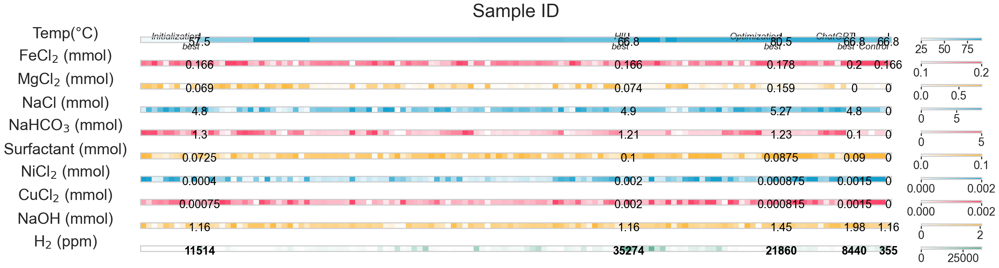

In [4]:
load_plt_setting()

special_samples = {
    10: "Initialization best",
    86: "HIL best", 
    113: "Optimization best",
    126: "ChatGPT best",
    132: "Control"
}

fig, axes = plt.subplots(10,1, sharex=False, gridspec_kw=dict(height_ratios=[1]*10), figsize=(26, 10))

def add_special_values(ax, data_row, row_idx):
    for (i, j), z in np.ndenumerate(data_row):
        if j in special_samples:
            if row_idx == 9:
                ax.text(j, i+0.5, '{:.0f}'.format(z), ha='center', va='center', fontsize=22, c='black', weight='bold')
            else:
                ax.text(j, i+0.5, '{:.3g}'.format(z), ha='center', va='center', fontsize=22, c='black')

# Plot each feature row
cmaps = [["#ffffff","#139FCD"], ["#ffffff","#fe456b"], ["#ffffff","#ffb93e"]]
for idx, ax in enumerate(axes):
    cmap = colors.LinearSegmentedColormap.from_list("", cmaps[idx % 3])
    if idx < 9:
        mat = ax.matshow(data[idx:idx+1,:], cmap=cmap, vmin=data_range[idx][0], vmax=data_range[idx][1])
    else:
        mat = ax.matshow(data[9:10,:], cmap=colors.LinearSegmentedColormap.from_list("", ["#ffffff","#4da888"]), vmin=0, vmax=36000)
    
    add_special_values(ax, data[idx:idx+1,:], idx)
    
    ax.set_ylabel(head[idx], labelpad=0, fontsize=30, rotation=0)
    ax.yaxis.set_label_coords(-0.1, 0.25)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])
    
    cax = ax.inset_axes([1.04,0.45,0.08,0.35], transform=ax.transAxes)
    cbar = plt.colorbar(mat, ax=ax, cax=cax, orientation='horizontal', aspect=200, shrink=10)
    cbar.ax.tick_params(axis='x', direction='out', length=6, width=2, pad=3, labelsize=22)

axes[0].set_xlabel(r'Sample ID', labelpad=30, fontsize=36)
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.set_ticks_position('bottom')
axes[0].tick_params(axis='both',direction='out',length=8,width=2,pad=0,color='black',labelsize=30, top=True, labeltop=True, bottom=False, labelbottom=False)

sample_titles_split = ["Initialization\nbest", "HIL\nbest", "Optimization\nbest", "ChatGPT\nbest", "\n Control"]
axes[0].set_xticks(list(special_samples.keys()))
axes[0].set_xticklabels(sample_titles_split, rotation=0, fontsize=18, style='italic', ha='right', va='top')

plt.subplots_adjust(hspace=-0.7)
plt.show()

# 2. GPR teacher model

In [5]:
# Normalize input variables
data_norm = np.array(data)
data_norm[0] = (data_norm[0]-25)/(90-25)     # Temp: [25,90] → [0,1]
data_norm[1] = (data_norm[1]-0.1)/(0.2-0.1) # FeCl2: [0.1,0.2] → [0,1]  
data_norm[2] = data_norm[2]/0.8              # MgCl2: [0,0.8] → [0,1]
data_norm[3] = data_norm[3]/8.5              # NaCl: [0,8.5] → [0,1]
data_norm[4] = data_norm[4]/5.0              # NaHCO3: [0,5.0] → [0,1]
data_norm[5] = data_norm[5]/0.1              # Surfactant: [0,0.1] → [0,1]
data_norm[6] = data_norm[6]/0.002            # NiCl2: [0,0.002] → [0,1]
data_norm[7] = data_norm[7]/0.002            # CuCl2: [0,0.002] → [0,1]
data_norm[8] = data_norm[8]/2.05             # NaOH: [0,2.05] → [0,1]

X_train = np.swapaxes(data_norm[:-1,:],0,1)   # 9 normalized inputs
Y_train = np.swapaxes(data_norm[-1:,:],0,1)   # Original H2 output (not normalized!)

# Calculate variance bounds
data_variance = Y_train.var()
conservative_lower = data_variance * 0.1
conservative_upper = data_variance * 5

print(f"Data variance: {data_variance:.0f}")
print(f"Variance bounds: ({conservative_lower:.0f}, {conservative_upper:.0f})")

# Build kernel
ker = GPy.kern.Matern52(input_dim=X_train.shape[1], ARD=True)
ker.lengthscale.constrain_bounded(0.01, 2.0)
ker.variance.constrain_bounded(conservative_lower, conservative_upper)
ker.variance = min(data_variance, conservative_upper * 0.8)
ker.lengthscale = np.ones(X_train.shape[1]) * 0.5
ker += GPy.kern.White(input_dim=X_train.shape[1])

# Train model
model_gpy = GPRegression(X_train, Y_train, ker)
model_gpy.Gaussian_noise.variance = (Y_train.std() * 0.1)**2
model_gpy.Gaussian_noise.variance.fix()
model_gpy.randomize()
model_gpy.optimize_restarts(num_restarts=30, verbose=False, messages=False)

print(f"Log likelihood: {model_gpy.log_likelihood():.2f}")

# Test predictions
Y_pred_test, Y_var_test = model_gpy.predict(X_train)
print(f"Prediction range: {Y_pred_test.min():.0f} to {Y_pred_test.max():.0f} ppm")

objective_model = GPyModelWrapper(model_gpy)

# Set anchor point for response surface plots
anchor = data_norm[:-1, 86]
print(f"Anchor set to best experimental conditions")

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Data variance: 37203718
Variance bounds: (3720372, 186018590)
Log likelihood: -1324.93
Prediction range: 0 to 34939 ppm
Anchor set to best experimental conditions


In [39]:
# List of names in the exact order of your data_norm indexing
feature_names = ['Temp', 'FeCl2', 'MgCl2', 'NaCl', 'NaHCO3', 'Surfactant', 'NiCl2', 'CuCl2', 'NaOH']

# Retrieve the trained lengthscales
ls_values = model_gpy.kern.Mat52.lengthscale.values

print(f"{'Index':<7} | {'Variable':<12} | {'Lengthscale'}")
print("-" * 40)
for i, (name, val) in enumerate(zip(feature_names, ls_values)):
    print(f"[{i}] {name:<12} | {val:.8f}")



Index   | Variable     | Lengthscale
----------------------------------------
[0] Temp         | 0.01000000
[1] FeCl2        | 0.29028957
[2] MgCl2        | 0.24946556
[3] NaCl         | 0.46202288
[4] NaHCO3       | 0.06106409
[5] Surfactant   | 0.36443289
[6] NiCl2        | 1.07719521
[7] CuCl2        | 1.33691807
[8] NaOH         | 0.11100166


In [40]:
# Extract lengthscales for importance analysis
variable_names = ['Temp', 'FeCl₂', 'MgCl₂', 'NaCl', 'NaHCO₃', 'Surfactant', 'NiCl₂', 'CuCl₂', 'NaOH']

# Access lengthscales from composite kernel
if hasattr(model_gpy.kern, 'sum'):
    lengthscales = model_gpy.kern.sum.parts[0].lengthscale.values
    variance = model_gpy.kern.sum.parts[0].variance.values[0]
else:
    lengthscales = model_gpy.kern.Mat52.lengthscale.values
    variance = model_gpy.kern.Mat52.variance.values[0]

# Display importance (shorter lengthscale = more important)
print("Variable Importance (ARD lengthscales):")
importance_order = np.argsort(lengthscales)
for rank, idx in enumerate(importance_order, 1):
    print(f"{rank}. {variable_names[idx]:<15} ℓ = {lengthscales[idx]:.3f}")

Variable Importance (ARD lengthscales):
1. Temp            ℓ = 0.010
2. NaHCO₃          ℓ = 0.061
3. NaOH            ℓ = 0.111
4. MgCl₂           ℓ = 0.249
5. FeCl₂           ℓ = 0.290
6. Surfactant      ℓ = 0.364
7. NaCl            ℓ = 0.462
8. NiCl₂           ℓ = 1.077
9. CuCl₂           ℓ = 1.337


## 2.1 Plots using GPR model

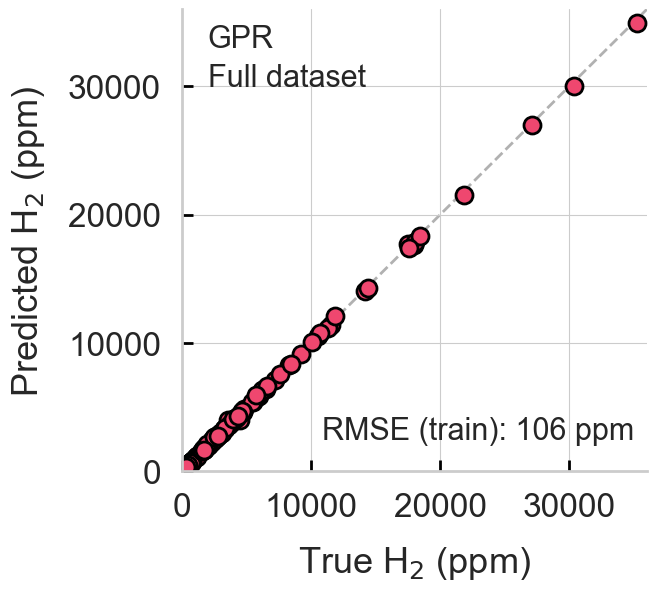

In [41]:
load_plt_setting()

# Get predictions
Y_pred_temp, _ = model_gpy.predict(X_train)
Y_pred = Y_pred_temp.flatten()
Y_true = Y_train[:,0] if Y_train.ndim > 1 else Y_train.flatten()

fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(Y_true, Y_pred, s=150, color=colors.to_rgba("#ef476f"), edgecolor="black", linewidth=2)
ax.plot([0,36000], [0,36000], linewidth=2, color=colors.to_rgba("#B1B1B1"), linestyle='--', zorder=-10)

ax.set_xlim([0,36000])
ax.set_ylim([0,36000])
ax.set_xlabel(r'True H$_2$ (ppm)', labelpad=15, fontsize=26)
ax.set_ylabel(r'Predicted H$_2$ (ppm)', labelpad=15, fontsize=26)

ax.text(2000,33000,'GPR', size=22)
ax.text(2000,30000,'Full dataset', size=22)
ax.text(35000,2500,'RMSE (train): {:.0f} ppm'.format(math.sqrt(mean_squared_error(Y_train[:,0],Y_pred))), size=22, ha='right')

ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
ax.tick_params(axis='both',direction='in',length=8,width=2,pad=15,color='black',labelsize=24)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

### 2.1.1 GPR Cross-validation plots

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Processing fold 1/5...


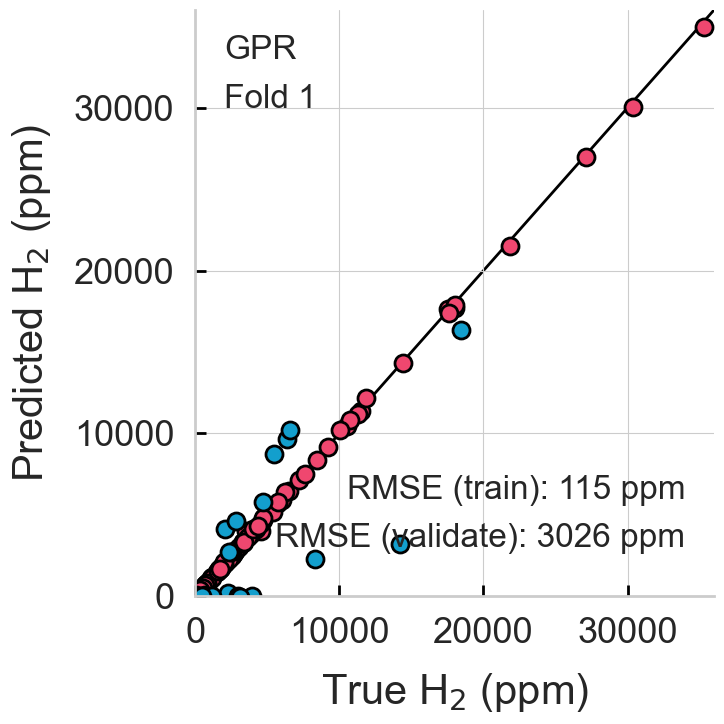

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Processing fold 2/5...


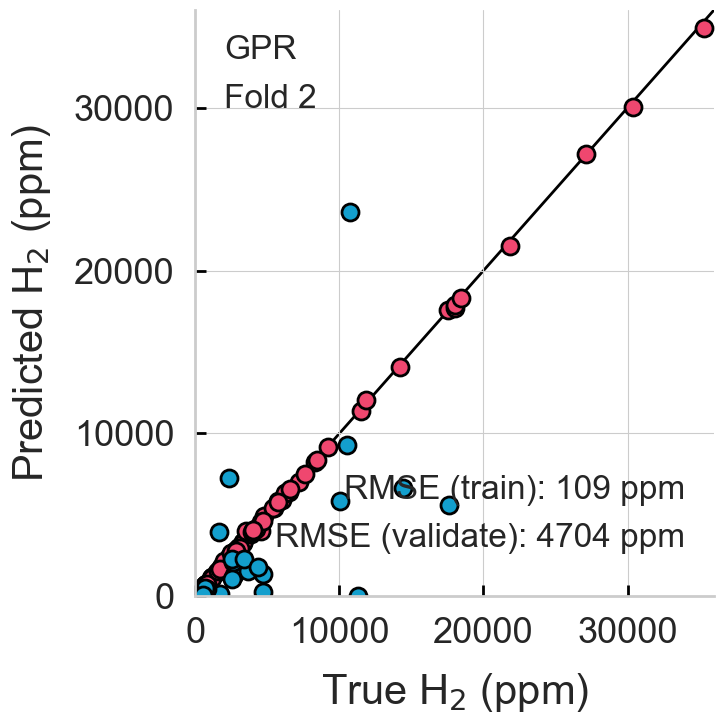

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Processing fold 3/5...


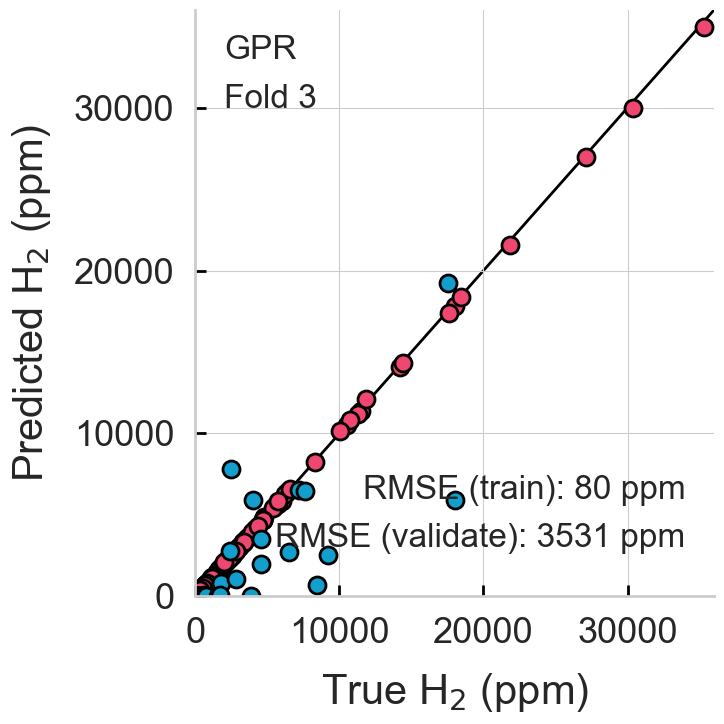

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Processing fold 4/5...


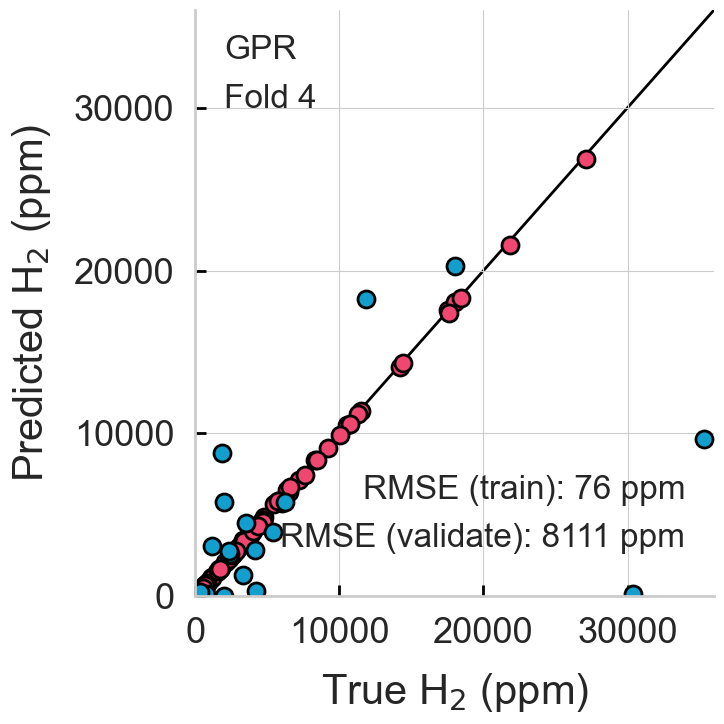

reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance


Processing fold 5/5...


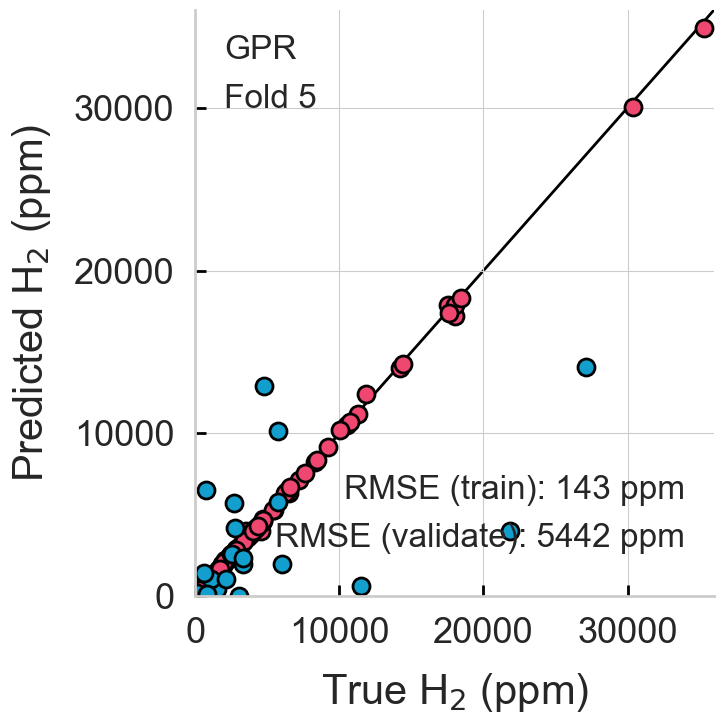


AVERAGE PERFORMANCE:
Training RMSE: 105 ± 28 ppm
Validation RMSE: 4963 ± 2001 ppm
Training R²: 1.000 ± 0.000
Validation R²: 0.292 ± 0.204


In [18]:
kf = KFold(n_splits=5, shuffle=True, random_state=27)
cv_results = []
Y_true = Y_train[:,0] if Y_train.ndim > 1 else Y_train.flatten()

for i, (train_indexes, test_indexes) in enumerate(kf.split(X_train)):
    print(f"Processing fold {i+1}/5...")
    
    # Build kernel with same constraints as main model
    ker = GPy.kern.Matern52(input_dim=X_train.shape[1], ARD=True)
    ker.lengthscale.constrain_bounded(0.01, 2.0)
    ker.variance.constrain_bounded(conservative_lower, conservative_upper)
    ker += GPy.kern.White(input_dim=X_train.shape[1])
    
    model_gpy_kfold = GPRegression(X_train[train_indexes], Y_true[train_indexes].reshape(-1, 1), ker)
    
    fold_std = Y_true[train_indexes].std()
    model_gpy_kfold.Gaussian_noise.variance = (fold_std * 0.1)**2
    model_gpy_kfold.Gaussian_noise.variance.fix()
    model_gpy_kfold.randomize()
    model_gpy_kfold.optimize_restarts(num_restarts=30, verbose=False, messages=False)
    
    objective_model_kfold = GPyModelWrapper(model_gpy_kfold)
    
    Y_test_pred, _ = objective_model_kfold.model.predict(X_train[test_indexes])
    Y_train_pred, _ = objective_model_kfold.model.predict(X_train[train_indexes])
    
    train_rmse = math.sqrt(mean_squared_error(Y_true[train_indexes], Y_train_pred))
    test_rmse = math.sqrt(mean_squared_error(Y_true[test_indexes], Y_test_pred))
    
    cv_results.append({
        'fold': i+1,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_r2': r2_score(Y_true[train_indexes], Y_train_pred),
        'test_r2': r2_score(Y_true[test_indexes], Y_test_pred)
    })
    
    # Plot fold results
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(Y_true[train_indexes], Y_train_pred, s=150, color=colors.to_rgba("#ef476f"), 
               edgecolor="black", linewidth=2, label='Training')
    ax.scatter(Y_true[test_indexes], Y_test_pred, s=150, color=colors.to_rgba("#139FCD"), 
               edgecolor="black", linewidth=2, label='Validation')
    ax.plot([0,36000], [0,36000], linewidth=2, color='black', linestyle='-', zorder=-10)
    
    ax.set_xlim([0,36000])
    ax.set_ylim([0,36000])
    ax.set_xlabel(r'True H$_2$ (ppm)', labelpad=15, fontsize=30)
    ax.set_ylabel(r'Predicted H$_2$ (ppm)', labelpad=15, fontsize=30)
    
    ax.text(2000, 33000, 'GPR', size=24)
    ax.text(2000, 30000, f'Fold {i+1}', size=24)
    ax.text(34000, 6000, f'RMSE (train): {train_rmse:.0f} ppm', size=24, ha='right')
    ax.text(34000, 3000, f'RMSE (validate): {test_rmse:.0f} ppm', size=24, ha='right')
    
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    ax.tick_params(axis='both',direction='in',length=8,width=2,pad=15,color='black',labelsize=26)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# Summary statistics
cv_df = pd.DataFrame(cv_results)
print(f"\nAVERAGE PERFORMANCE:")
print(f"Training RMSE: {cv_df['train_rmse'].mean():.0f} ± {cv_df['train_rmse'].std():.0f} ppm")
print(f"Validation RMSE: {cv_df['test_rmse'].mean():.0f} ± {cv_df['test_rmse'].std():.0f} ppm")
print(f"Training R²: {cv_df['train_r2'].mean():.3f} ± {cv_df['train_r2'].std():.3f}")
print(f"Validation R²: {cv_df['test_r2'].mean():.3f} ± {cv_df['test_r2'].std():.3f}")

### 2.1.2 2D Partial Dependence Heatmap & 2D PD Uncertainty Heatmap Plots 

Generating plot 1/36: Temp (°C) vs FeCl$_2$ (mmol)

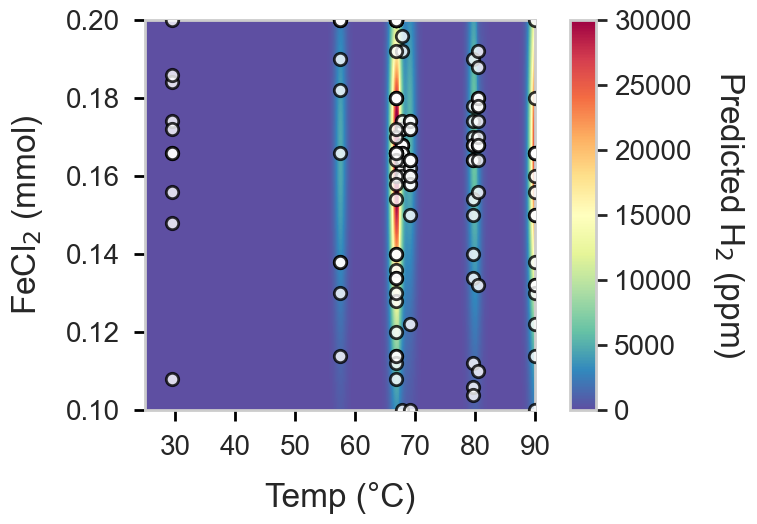

Generating plot 2/36: Temp (°C) vs MgCl$_2$ (mmol)

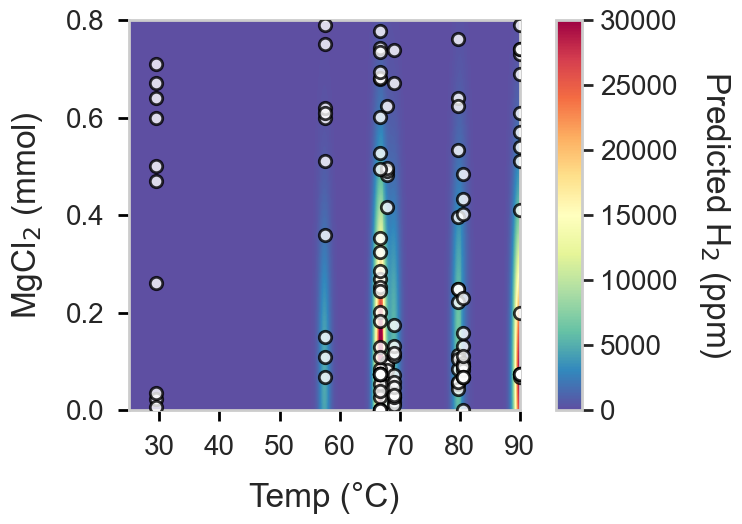

Generating plot 3/36: Temp (°C) vs NaCl (mmol)

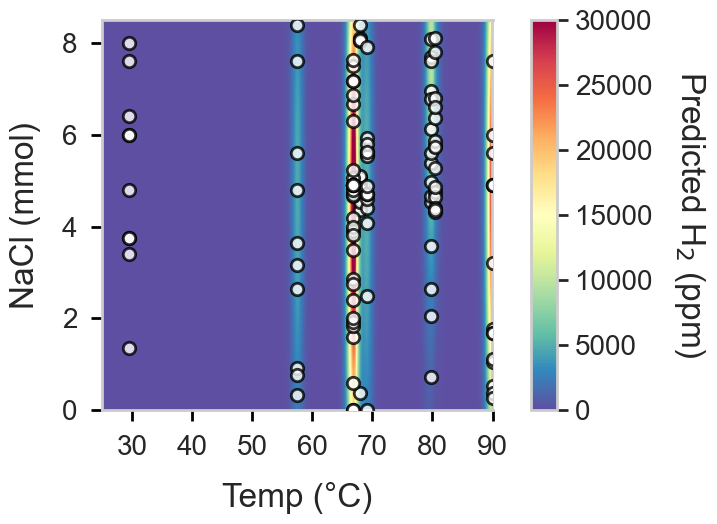

Generating plot 4/36: Temp (°C) vs NaHCO$_3$ (mmol)

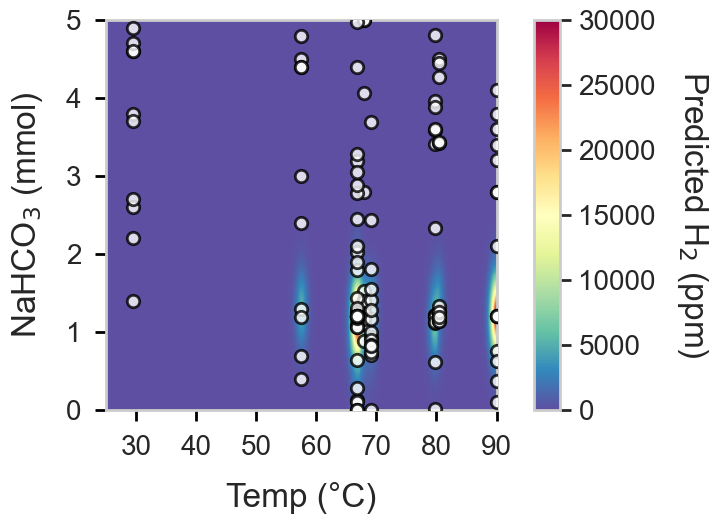

Generating plot 5/36: Temp (°C) vs Surfactant (mmol)

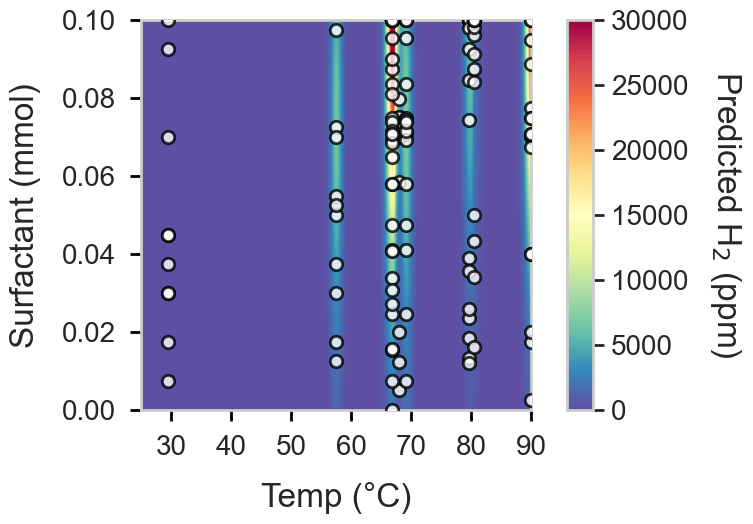

Generating plot 6/36: Temp (°C) vs NiCl$_2$ (mmol)

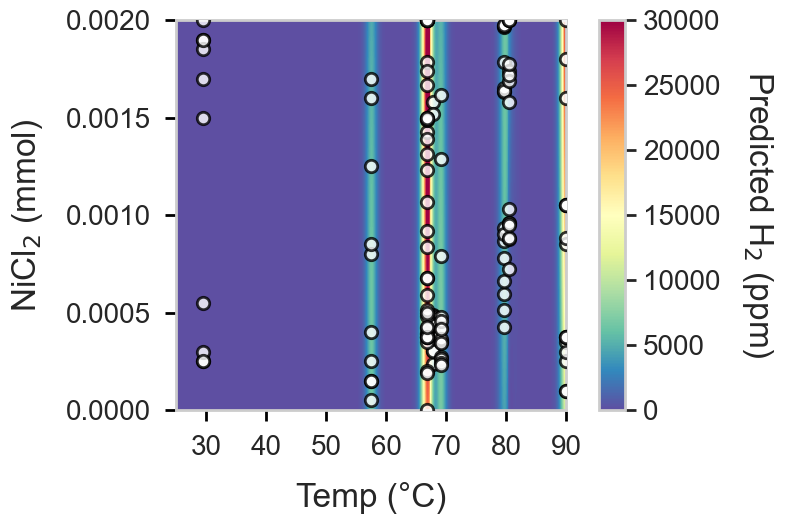

Generating plot 7/36: Temp (°C) vs CuCl$_2$ (mmol)

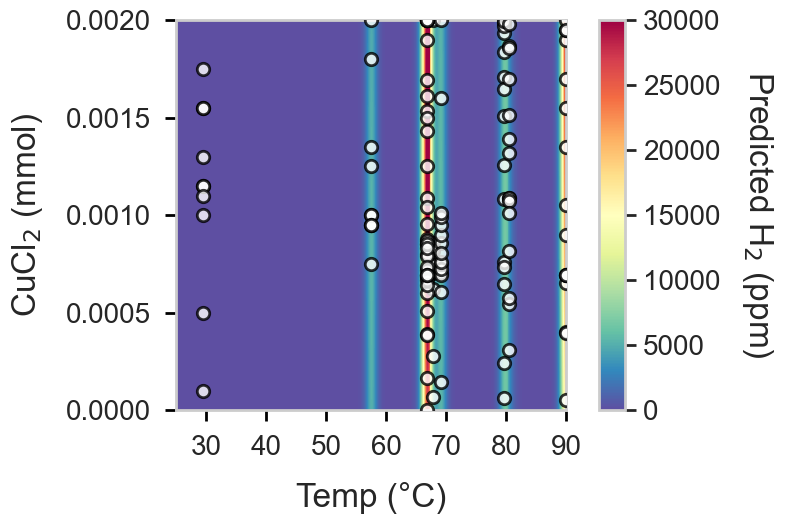

Generating plot 8/36: Temp (°C) vs NaOH (mmol)

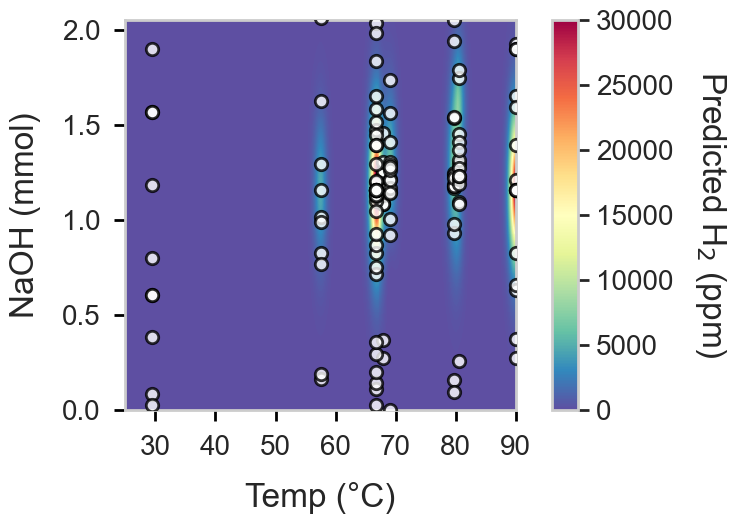

Generating plot 9/36: FeCl$_2$ (mmol) vs MgCl$_2$ (mmol)

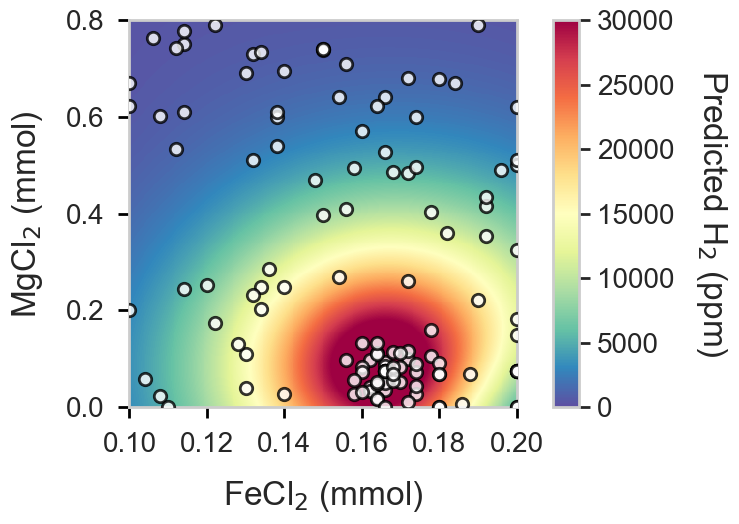

Generating plot 10/36: FeCl$_2$ (mmol) vs NaCl (mmol)

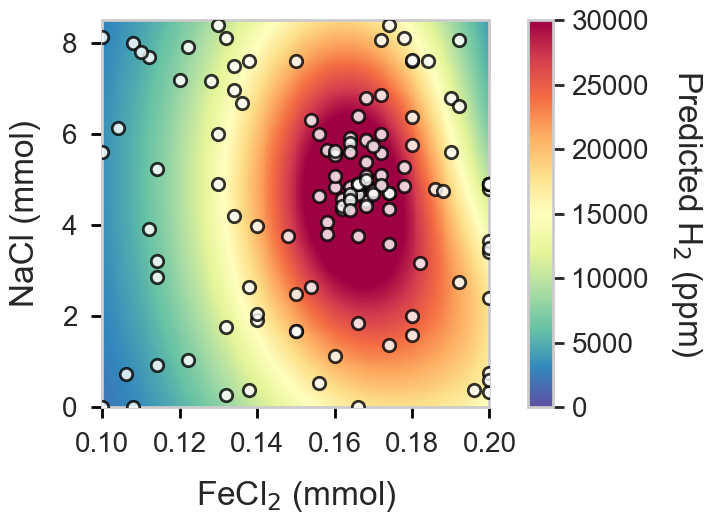

Generating plot 11/36: FeCl$_2$ (mmol) vs NaHCO$_3$ (mmol)

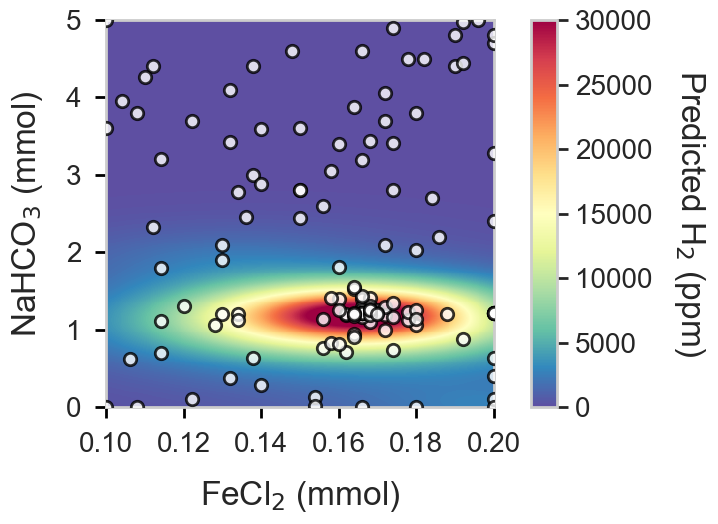

Generating plot 12/36: FeCl$_2$ (mmol) vs Surfactant (mmol)

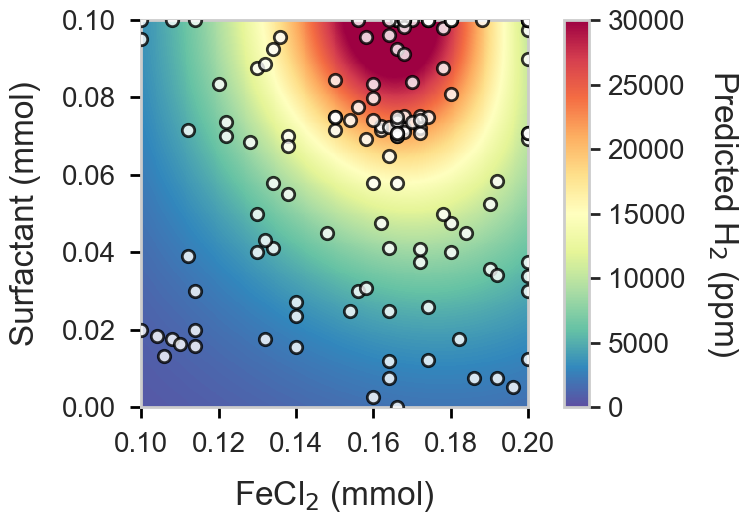

Generating plot 13/36: FeCl$_2$ (mmol) vs NiCl$_2$ (mmol)

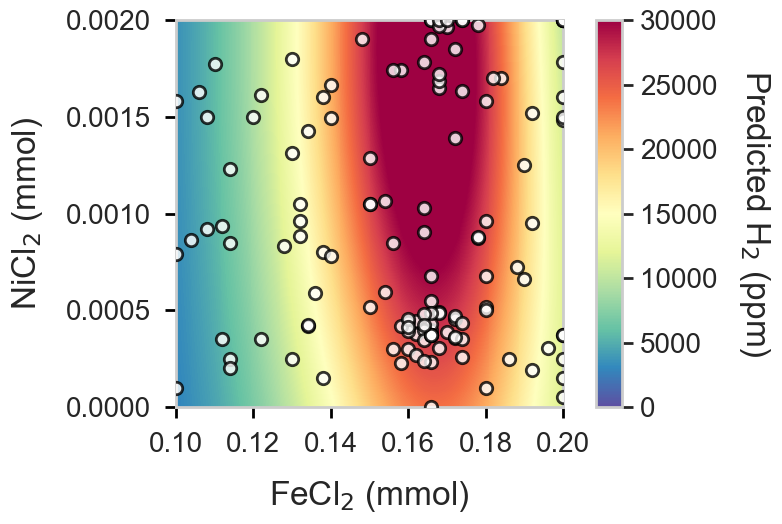

Generating plot 14/36: FeCl$_2$ (mmol) vs CuCl$_2$ (mmol)

KeyboardInterrupt: 

In [ ]:
#2D Partial Dependence Heatmaps

import itertools
from matplotlib.ticker import MultipleLocator

# Create high-resolution 2D grid (401×401 = 160,801 points)
x, y = np.meshgrid(np.linspace(0, 1, 401), np.linspace(0, 1, 401))
grid_2d = np.column_stack((x.ravel(), y.ravel()))

variable_names = ['Temp (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)', 
                 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)', 
                 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

variable_pairs = list(itertools.combinations(range(9), 2))

# Define output folder for saving plots
output_folder = ''

for plot_count, (a, b) in enumerate(variable_pairs, 1):
    print(f"\rGenerating plot {plot_count}/{len(variable_pairs)}: {variable_names[a]} vs {variable_names[b]}", end="")
    
    # Create sampling grid
    X_2D_sampling = np.zeros((grid_2d.shape[0], 9))
    X_2D_sampling[:,a] = grid_2d[:,0]
    X_2D_sampling[:,b] = grid_2d[:,1]
    for i in range(9):
        if i not in [a,b]:
            X_2D_sampling[:,i] = anchor[i]
    
    Y_pred, _ = objective_model.model.predict(X_2D_sampling)
    Y_pred = Y_pred.flatten()
    
    load_plt_setting()
    fig, ax = plt.subplots(figsize=(8, 6))
    
    extent = [data_range[a][0], data_range[a][1], data_range[b][0], data_range[b][1]]
    
    mat = ax.matshow(np.flipud(np.reshape(Y_pred, (401, 401))), extent=extent, 
                    aspect=(extent[1]-extent[0])/(extent[3]-extent[2]),
                    cmap='Spectral_r', vmin=0, vmax=30000)
    
    ax.scatter(data[a], data[b], color=colors.to_rgba("#ffffff"), s=80, 
               edgecolor="black", linewidth=2, zorder=10, alpha=0.8)
    
    ax.set_xlim([extent[0], extent[1]])
    ax.set_ylim([extent[2], extent[3]])
    ax.set_xlabel(variable_names[a], labelpad=15, fontsize=24)
    ax.set_ylabel(variable_names[b], labelpad=15, fontsize=24)
    
    ax.xaxis.set_ticks_position('bottom')
    
    # Set x-axis locator (every 10 for Temperature, otherwise MaxNLocator)
    if variable_names[a] == 'Temp (°C)':
        ax.xaxis.set_major_locator(MultipleLocator(10))
    else:
        ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    
    # Set y-axis locator (every 10 for Temperature, otherwise MaxNLocator)
    if variable_names[b] == 'Temp (°C)':
        ax.yaxis.set_major_locator(MultipleLocator(10))
    else:
        ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    
    ax.tick_params(axis='both', direction='out', length=8, width=2, pad=10, color='black', labelsize=20)
    ax.grid(False)
    
    cbar = fig.colorbar(mat, fraction=0.058, pad=0.07, aspect=15)
    cbar.ax.set_ylabel('Predicted H$_2$ (ppm)', labelpad=40, rotation=-90, fontsize=24)
    cbar.ax.tick_params(axis='y', direction='out', length=8, width=2, pad=5, labelsize=20)
    cbar.ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=6, integer=True))
    
    filename = f'{variable_names[a]}_vs_{variable_names[b]}'.replace(' ', '_').replace('(', '').replace(')', '').replace('$', '').replace('°C', 'degC')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_folder, f'{filename}.tiff'), dpi=600, bbox_inches='tight')
    plt.show()

print(f"\n✅ Generated {len(variable_pairs)} response surface plots")

Calculating global uncertainty range...
Global uncertainty scale: 0 - 6189 ppm
Generating plot 1/36: Temp (°C) vs FeCl$_2$ (mmol)

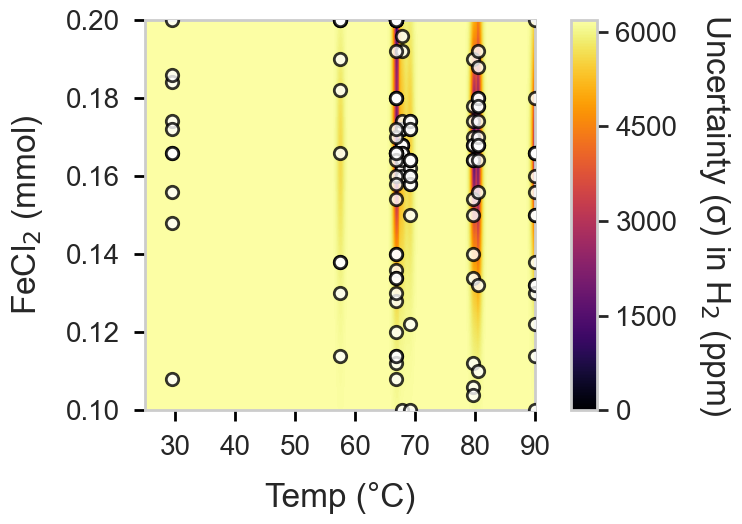

Generating plot 2/36: Temp (°C) vs MgCl$_2$ (mmol)

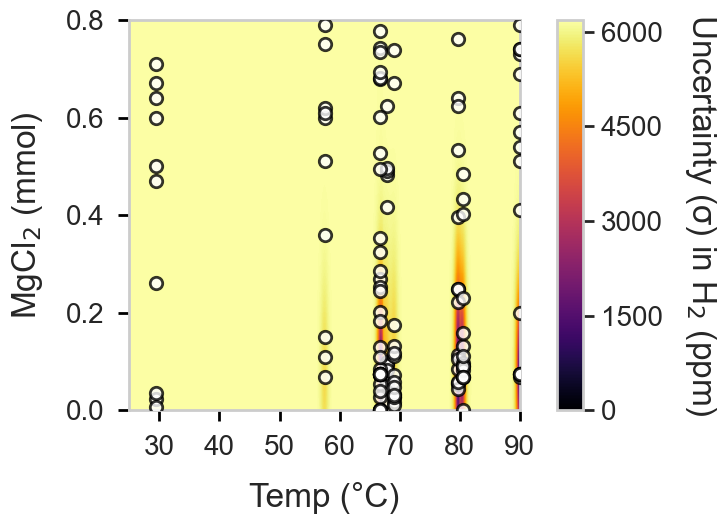

Generating plot 3/36: Temp (°C) vs NaCl (mmol)

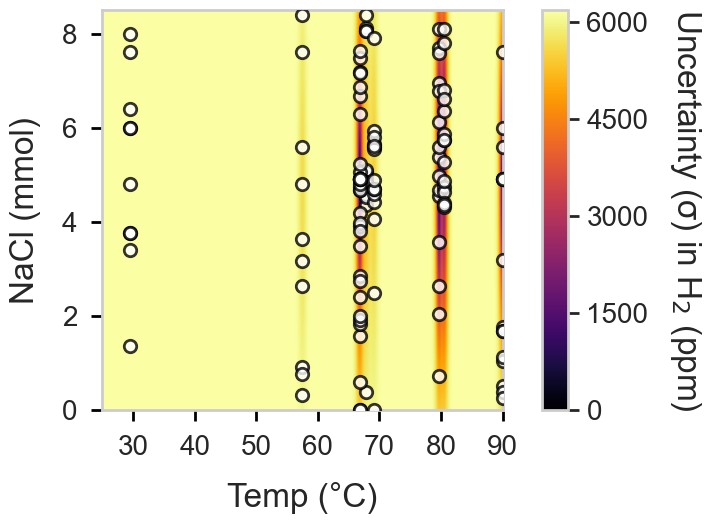

Generating plot 4/36: Temp (°C) vs NaHCO$_3$ (mmol)

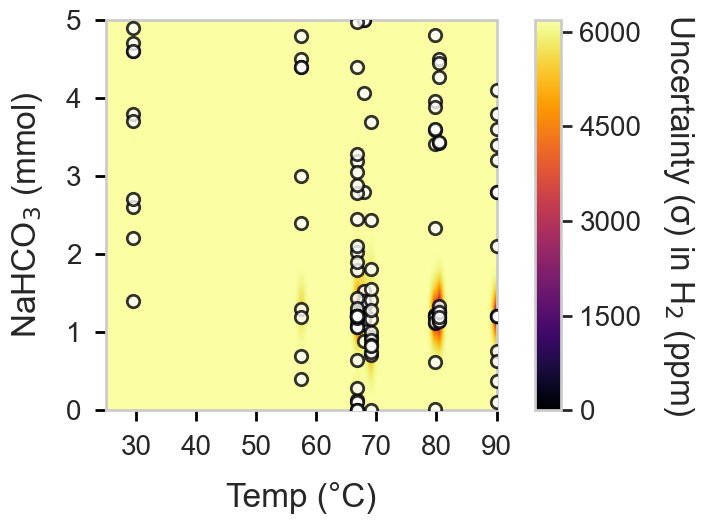

Generating plot 5/36: Temp (°C) vs Surfactant (mmol)

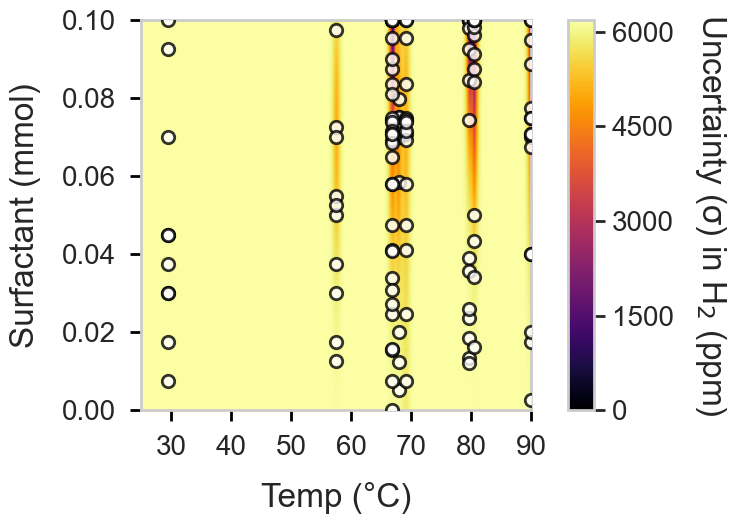

Generating plot 6/36: Temp (°C) vs NiCl$_2$ (mmol)

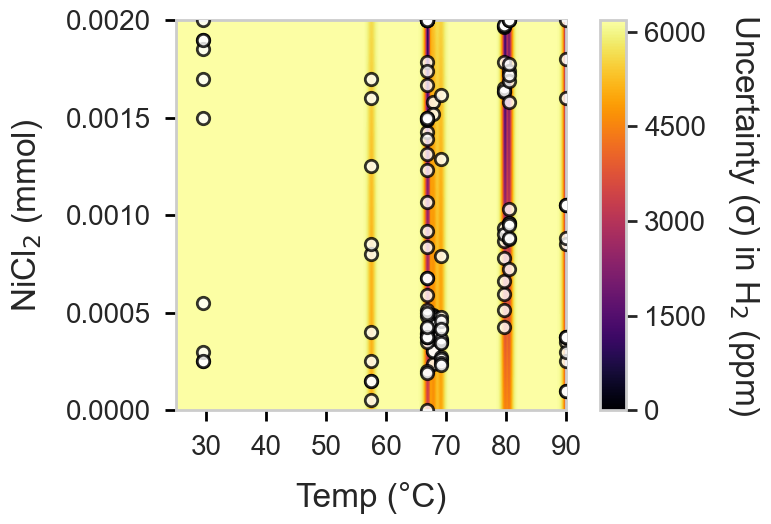

Generating plot 7/36: Temp (°C) vs CuCl$_2$ (mmol)

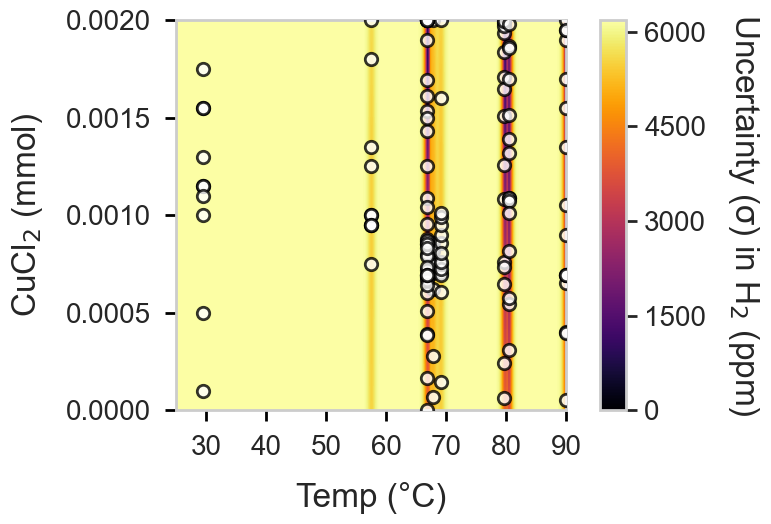

Generating plot 8/36: Temp (°C) vs NaOH (mmol)

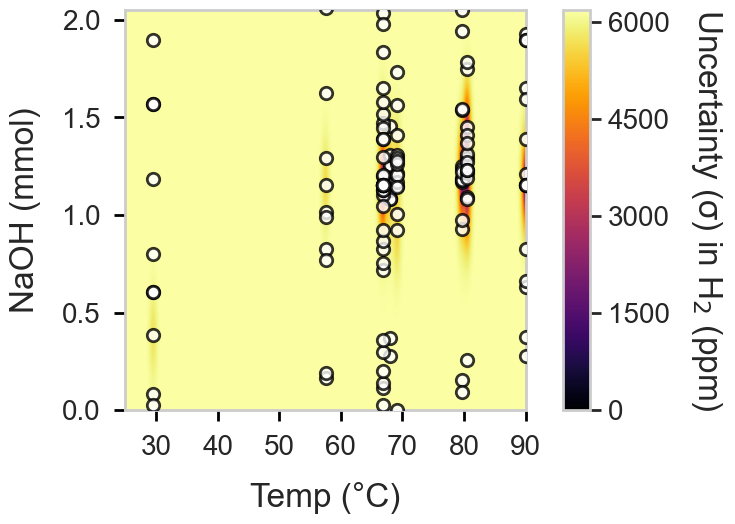

Generating plot 9/36: FeCl$_2$ (mmol) vs MgCl$_2$ (mmol)

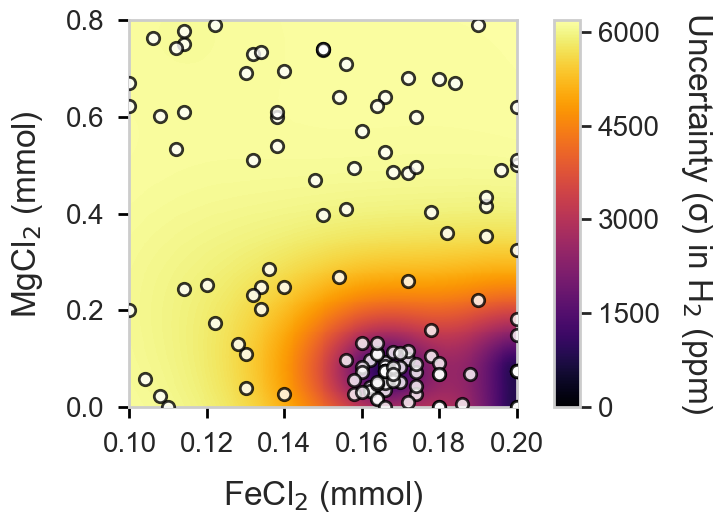

Generating plot 10/36: FeCl$_2$ (mmol) vs NaCl (mmol)

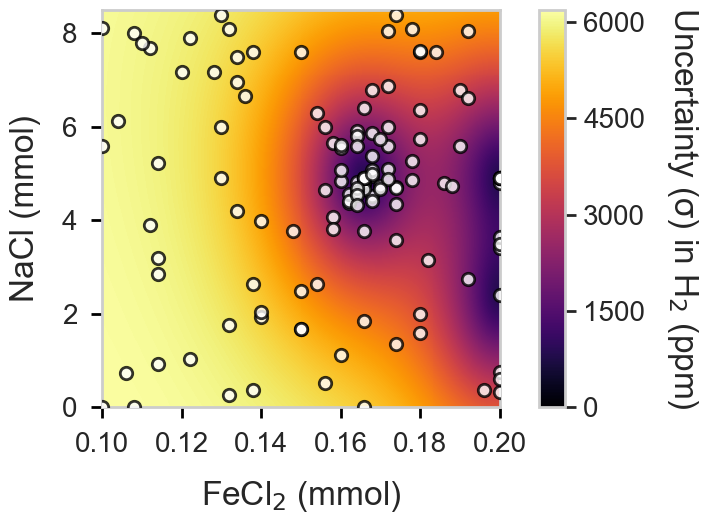

Generating plot 11/36: FeCl$_2$ (mmol) vs NaHCO$_3$ (mmol)

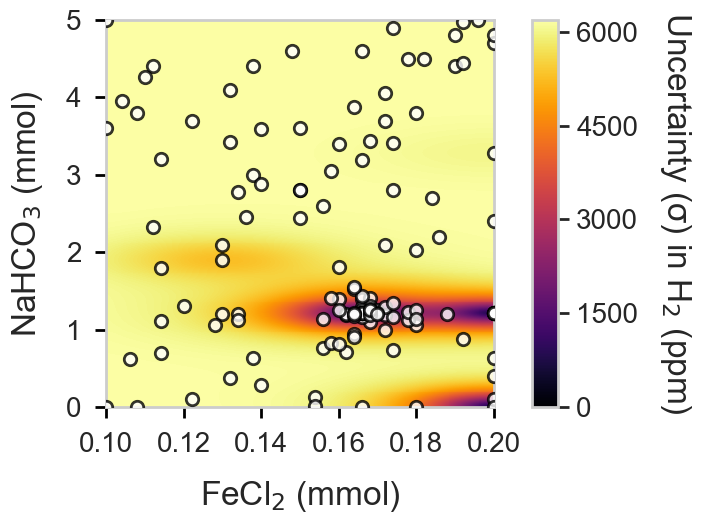

Generating plot 12/36: FeCl$_2$ (mmol) vs Surfactant (mmol)

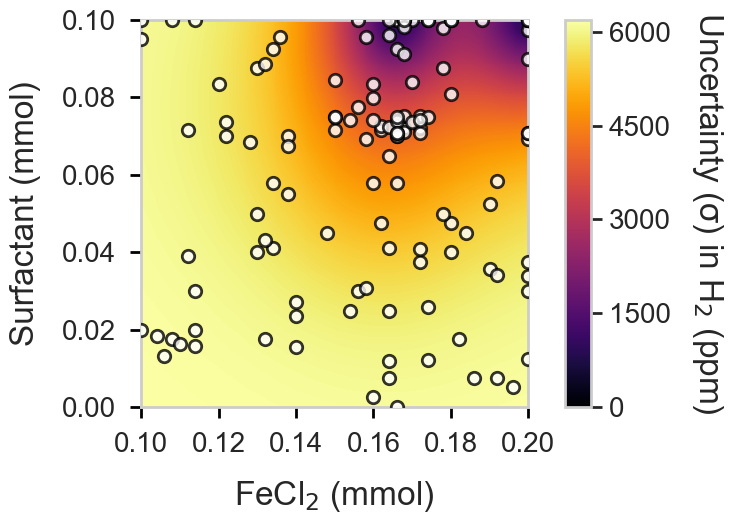

Generating plot 13/36: FeCl$_2$ (mmol) vs NiCl$_2$ (mmol)

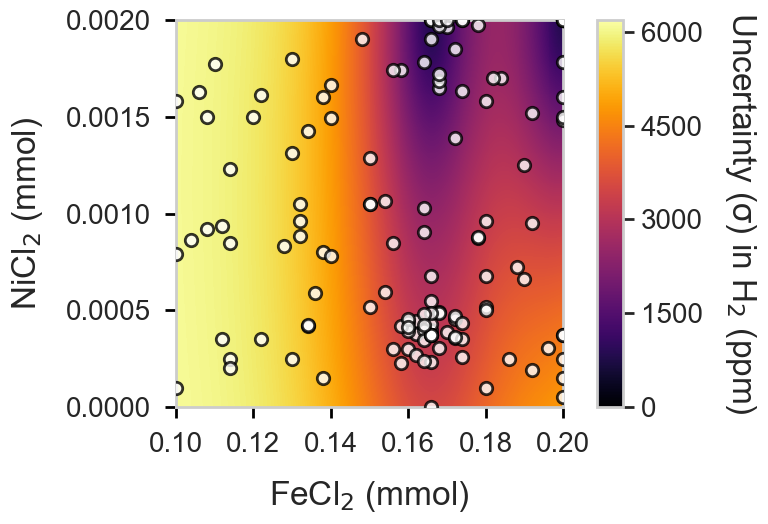

Generating plot 14/36: FeCl$_2$ (mmol) vs CuCl$_2$ (mmol)

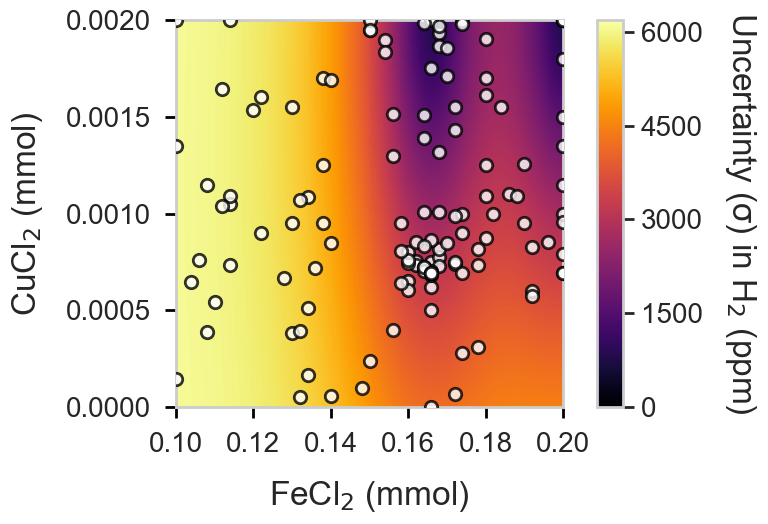

Generating plot 15/36: FeCl$_2$ (mmol) vs NaOH (mmol)

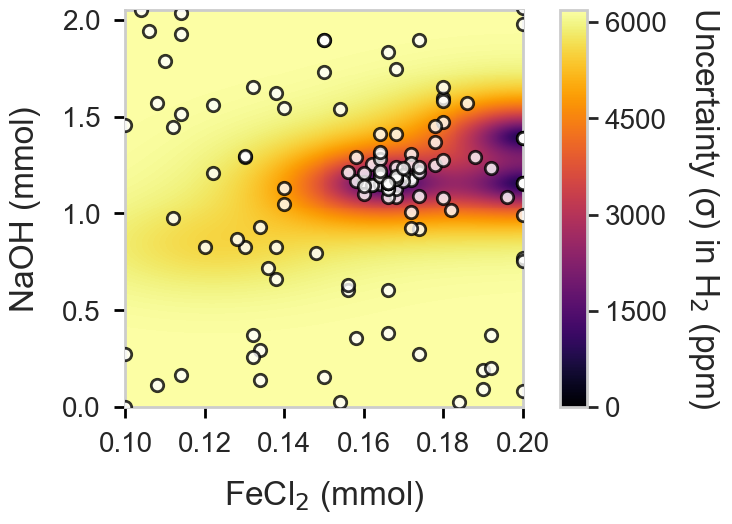

Generating plot 16/36: MgCl$_2$ (mmol) vs NaCl (mmol)

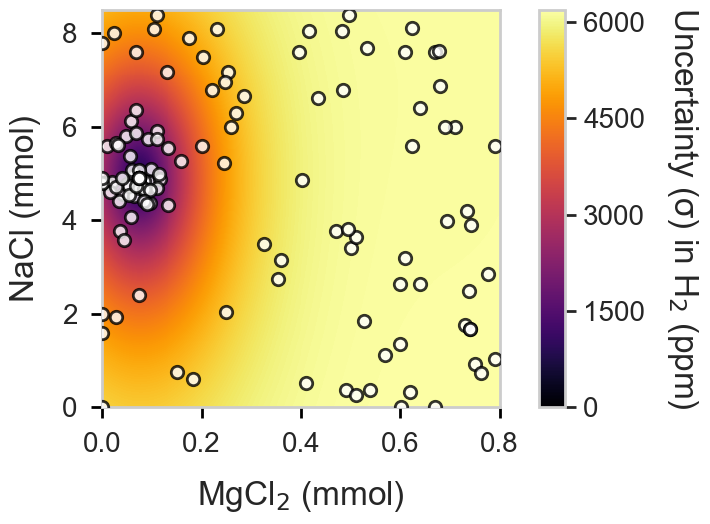

Generating plot 17/36: MgCl$_2$ (mmol) vs NaHCO$_3$ (mmol)

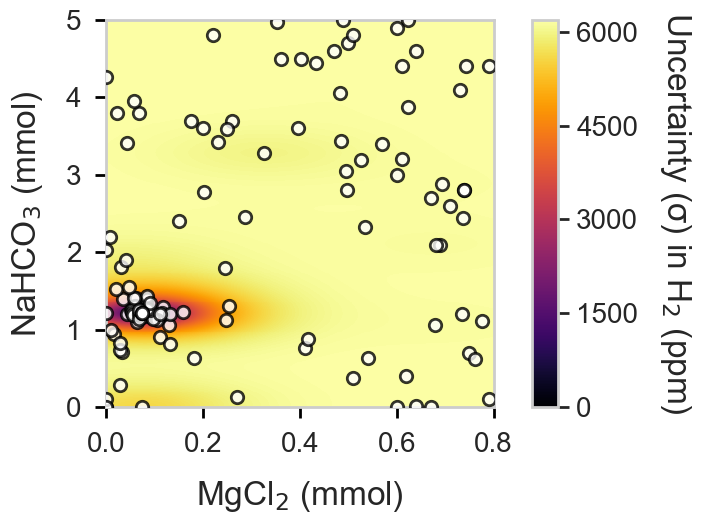

Generating plot 18/36: MgCl$_2$ (mmol) vs Surfactant (mmol)

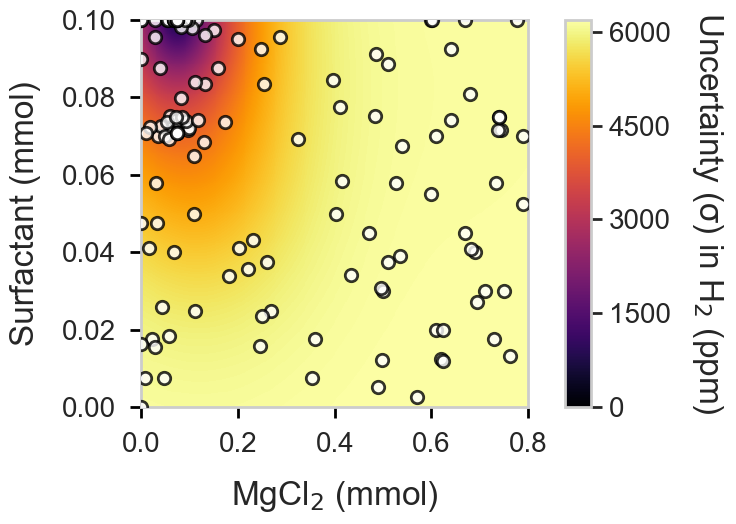

Generating plot 19/36: MgCl$_2$ (mmol) vs NiCl$_2$ (mmol)

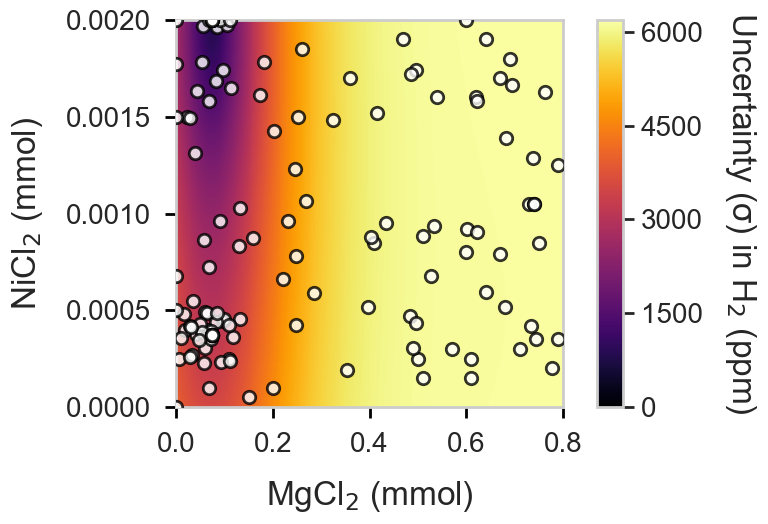

Generating plot 20/36: MgCl$_2$ (mmol) vs CuCl$_2$ (mmol)

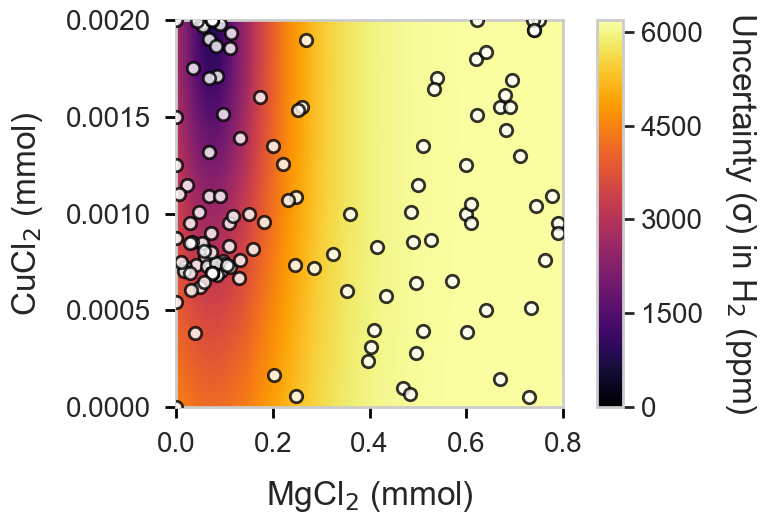

Generating plot 21/36: MgCl$_2$ (mmol) vs NaOH (mmol)

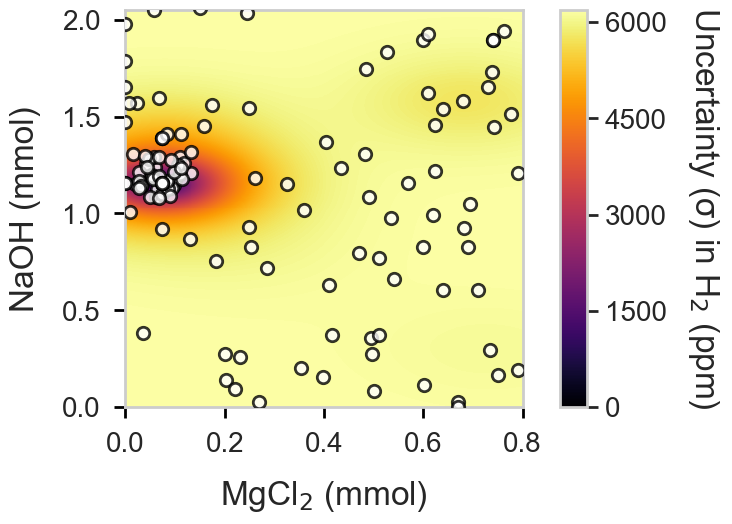

Generating plot 22/36: NaCl (mmol) vs NaHCO$_3$ (mmol)

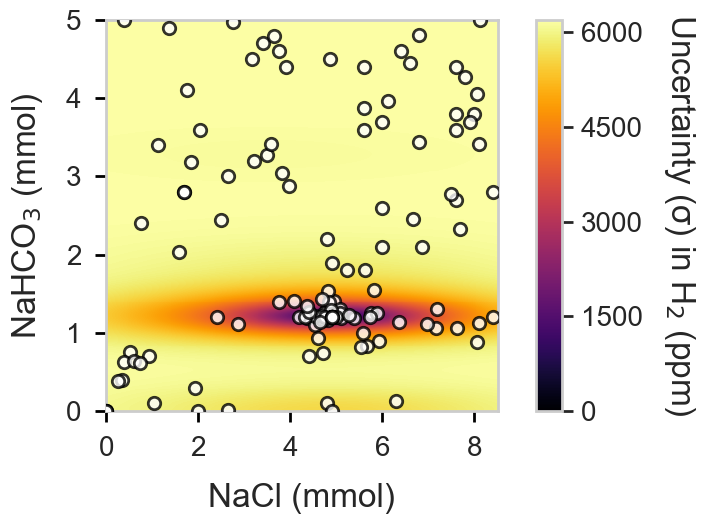

Generating plot 23/36: NaCl (mmol) vs Surfactant (mmol)

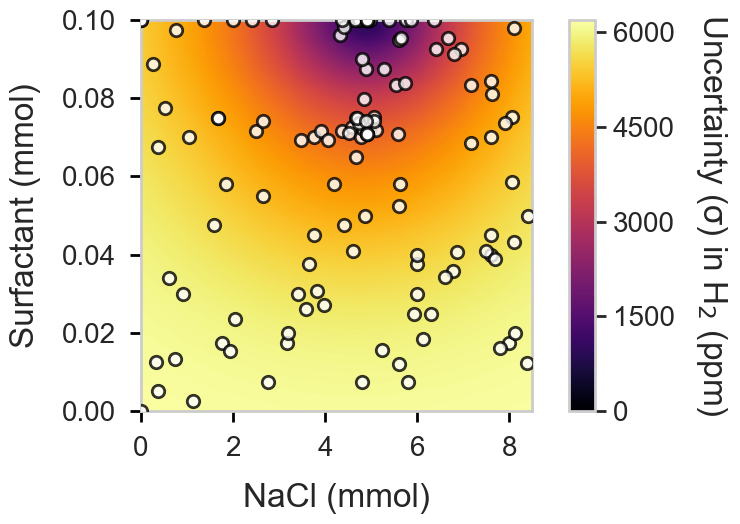

Generating plot 24/36: NaCl (mmol) vs NiCl$_2$ (mmol)

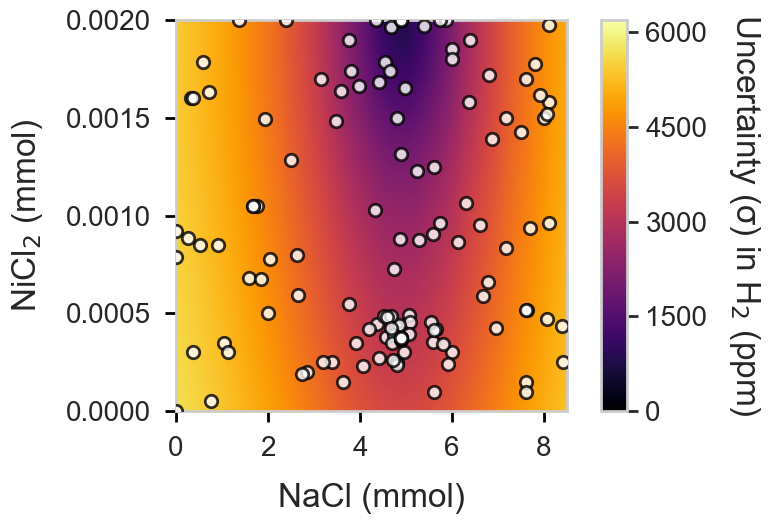

Generating plot 25/36: NaCl (mmol) vs CuCl$_2$ (mmol)

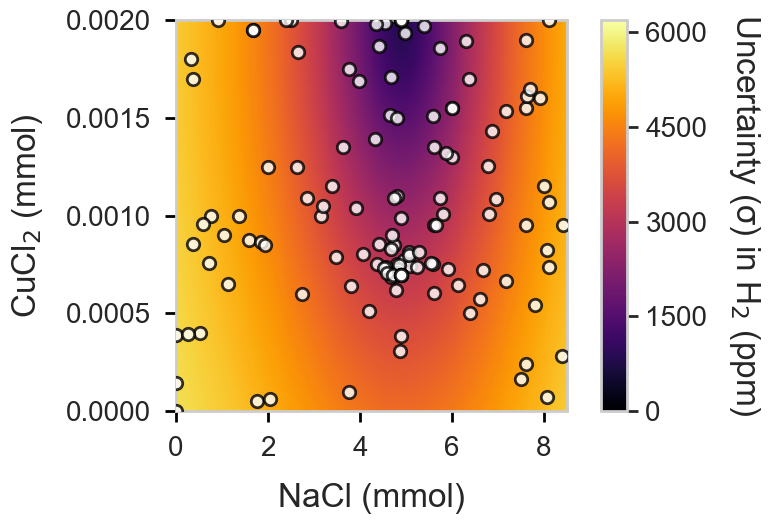

Generating plot 26/36: NaCl (mmol) vs NaOH (mmol)

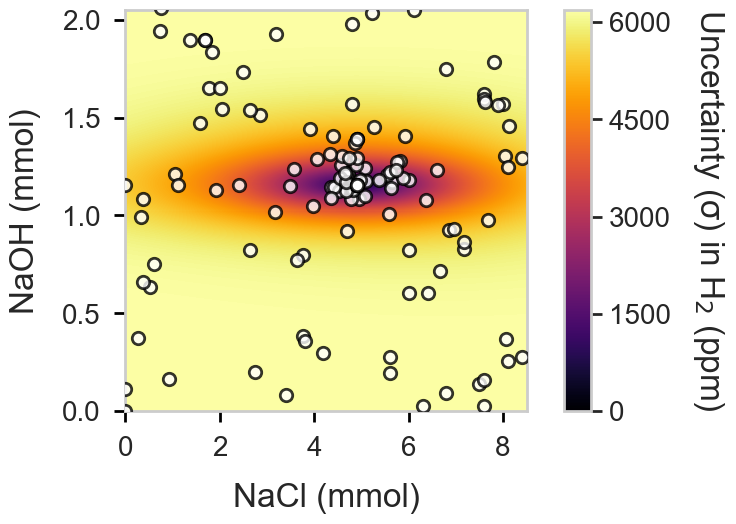

Generating plot 27/36: NaHCO$_3$ (mmol) vs Surfactant (mmol)

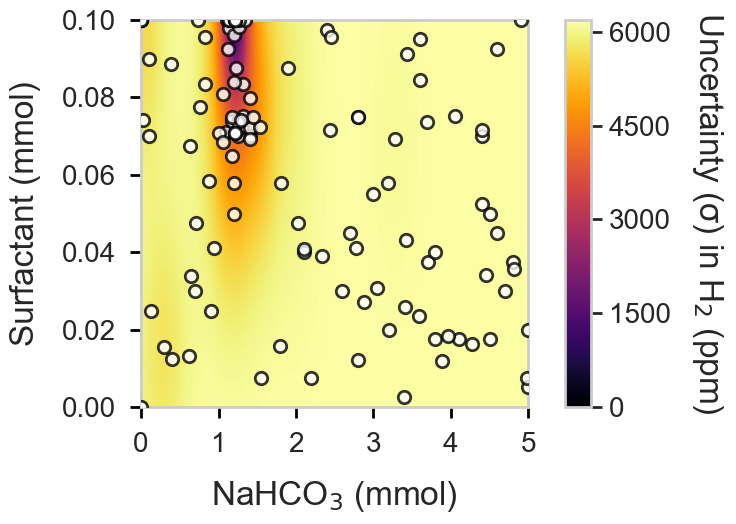

Generating plot 28/36: NaHCO$_3$ (mmol) vs NiCl$_2$ (mmol)

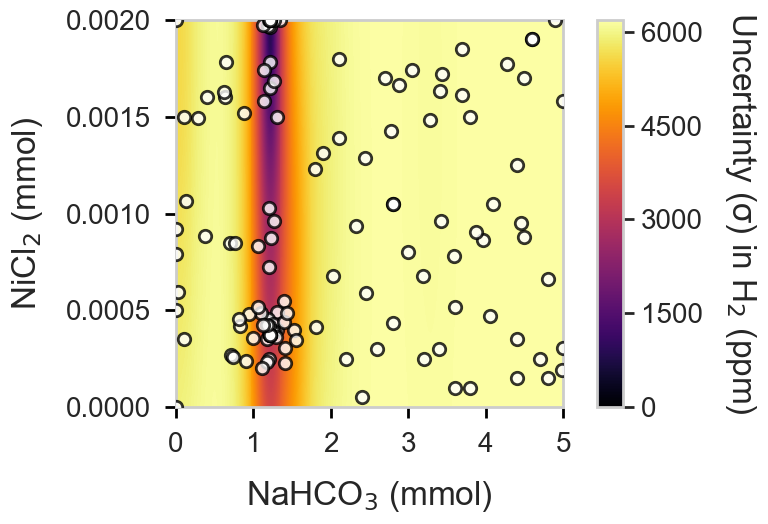

Generating plot 29/36: NaHCO$_3$ (mmol) vs CuCl$_2$ (mmol)

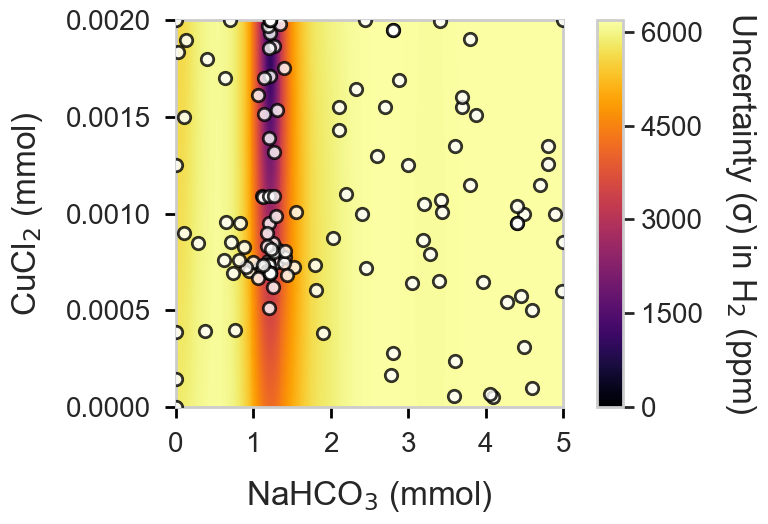

Generating plot 30/36: NaHCO$_3$ (mmol) vs NaOH (mmol)

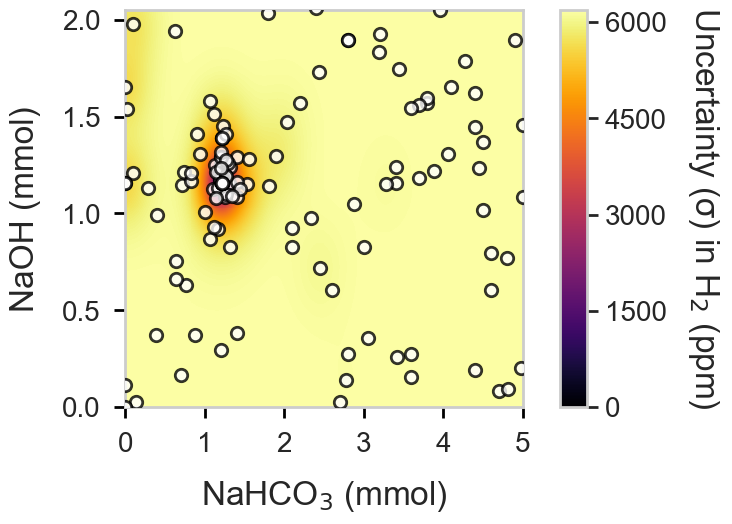

Generating plot 31/36: Surfactant (mmol) vs NiCl$_2$ (mmol)

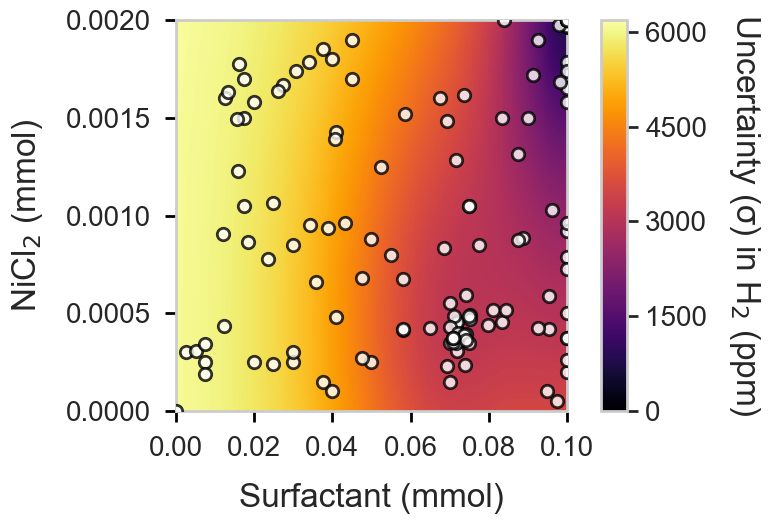

Generating plot 32/36: Surfactant (mmol) vs CuCl$_2$ (mmol)

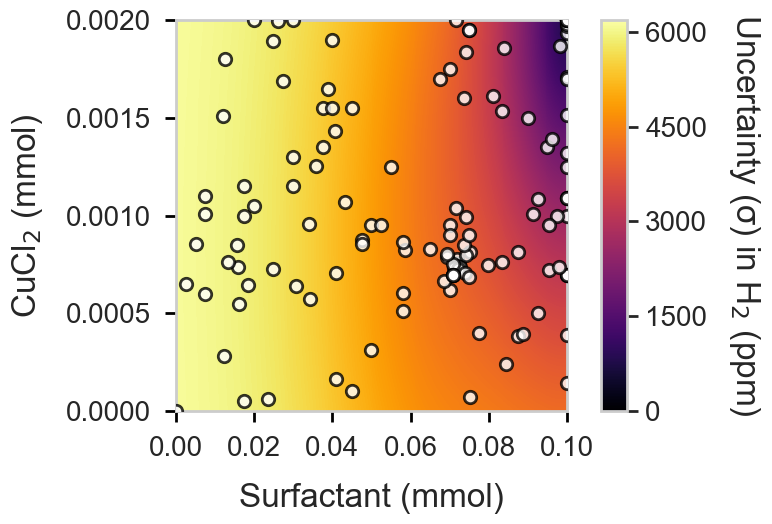

Generating plot 33/36: Surfactant (mmol) vs NaOH (mmol)

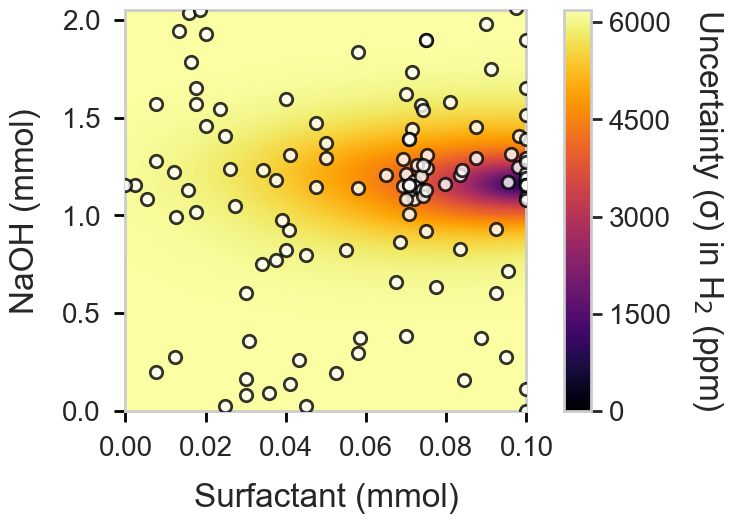

Generating plot 34/36: NiCl$_2$ (mmol) vs CuCl$_2$ (mmol)

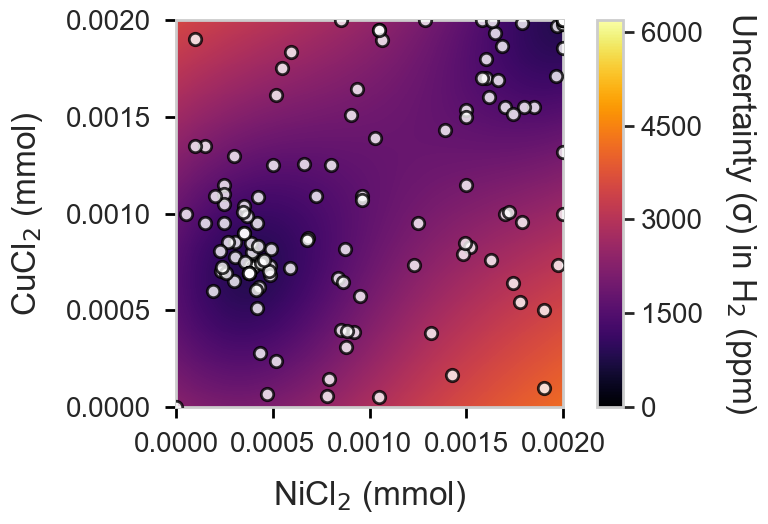

Generating plot 35/36: NiCl$_2$ (mmol) vs NaOH (mmol)

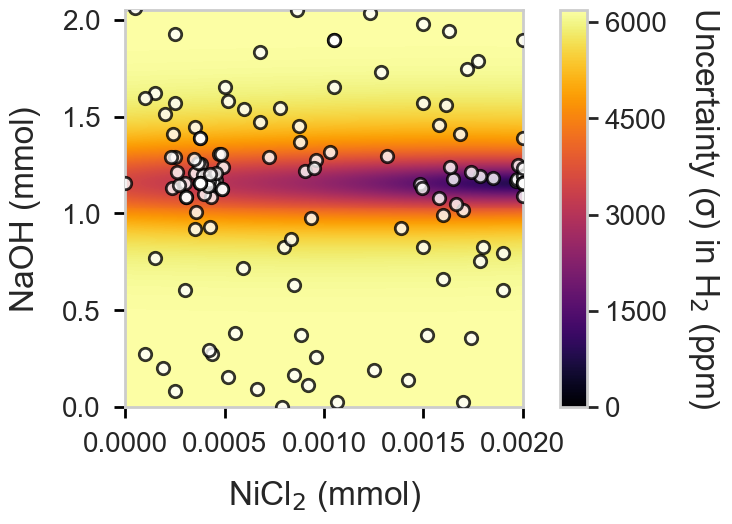

Generating plot 36/36: CuCl$_2$ (mmol) vs NaOH (mmol)

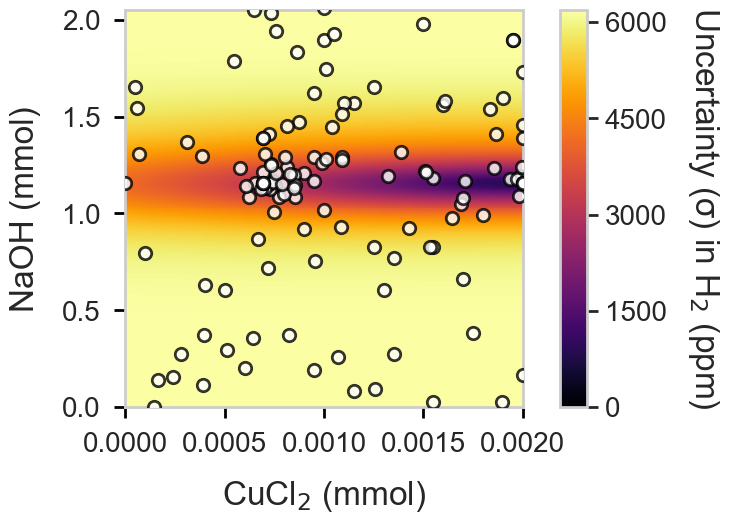


✅ Generated 36 uncertainty plots
Uncertainty range: 0 - 6189 ppm


In [ ]:
#UNCERTAINTY PLOTS

import itertools
from matplotlib.ticker import MultipleLocator

# Calculate global uncertainty range
print("Calculating global uncertainty range...")

global_uncers = []
variable_pairs = list(itertools.combinations(range(9), 2))

for (a, b) in variable_pairs[:5]:
    X_sample = np.zeros((1000, 9))
    X_sample[:,a] = np.random.uniform(0, 1, 1000)
    X_sample[:,b] = np.random.uniform(0, 1, 1000)
    for i in range(9):
        if i not in [a,b]:
            X_sample[:,i] = anchor[i]
    
    _, Y_var_sample = objective_model.model.predict(X_sample)
    Y_uncer_sample = np.sqrt(Y_var_sample.flatten())
    global_uncers.extend(Y_uncer_sample)

uncertainty_vmin = 0
uncertainty_vmax = np.percentile(global_uncers, 95)

print(f"Global uncertainty scale: {uncertainty_vmin:.0f} - {uncertainty_vmax:.0f} ppm")

# Generate uncertainty plots
#Define output folder for saving uncertainty plots
output_folder = ''
os.makedirs(output_folder, exist_ok=True)

for plot_count, (a, b) in enumerate(variable_pairs, 1):
    print(f"\rGenerating plot {plot_count}/{len(variable_pairs)}: {variable_names[a]} vs {variable_names[b]}", end="")
    
    X_2D_sampling = np.zeros((grid_2d.shape[0], 9))
    X_2D_sampling[:,a] = grid_2d[:,0]
    X_2D_sampling[:,b] = grid_2d[:,1]
    for i in range(9):
        if i not in [a,b]:
            X_2D_sampling[:,i] = anchor[i]
            
    _, Y_var = objective_model.model.predict(X_2D_sampling)
    Y_uncer = np.sqrt(Y_var.flatten())
    
    load_plt_setting()
    fig, ax = plt.subplots(figsize=(8, 6))
    
    extent = [data_range[a][0], data_range[a][1], data_range[b][0], data_range[b][1]]
    
    mat = ax.matshow(np.flipud(np.reshape(Y_uncer, (401, 401))), extent=extent, 
                     aspect=(extent[1]-extent[0])/(extent[3]-extent[2]),
                     cmap='inferno', vmin=uncertainty_vmin, vmax=uncertainty_vmax)
    
    ax.scatter(data[a], data[b], color=colors.to_rgba("#ffffff"), s=80, 
               edgecolor="black", linewidth=2, zorder=10, alpha=0.8)
    
    ax.set_xlim([extent[0], extent[1]])
    ax.set_ylim([extent[2], extent[3]])
    ax.set_xlabel(variable_names[a], labelpad=15, fontsize=24)
    ax.set_ylabel(variable_names[b], labelpad=15, fontsize=24)
    
    ax.xaxis.set_ticks_position('bottom')
    
    # Set x-axis locator (every 10 for Temperature, otherwise MaxNLocator)
    if variable_names[a] == 'Temp (°C)':
        ax.xaxis.set_major_locator(MultipleLocator(10))
    else:
        ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    
    # Set y-axis locator (every 10 for Temperature, otherwise MaxNLocator)
    if variable_names[b] == 'Temp (°C)':
        ax.yaxis.set_major_locator(MultipleLocator(10))
    else:
        ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, steps=[1, 2, 5, 10]))
    
    ax.tick_params(axis='both', direction='out', length=8, width=2, pad=10, color='black', labelsize=20)
    ax.grid(False)
    
    cbar = fig.colorbar(mat, fraction=0.058, pad=0.07, aspect=15)
    cbar.ax.set_ylabel('Uncertainty (σ) in H$_2$ (ppm)', labelpad=40, rotation=-90, fontsize=24)
    cbar.ax.tick_params(axis='y', direction='out', length=8, width=2, pad=5, labelsize=20)
    cbar.ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=6, integer=True))
    
    filename = f'{variable_names[a]}_vs_{variable_names[b]}'.replace(' ', '_').replace('(', '').replace(')', '').replace('$', '').replace('°C', 'degC')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_folder, f'{filename}_uncertainty.tiff'), dpi=600, bbox_inches='tight')
    plt.show()

print(f"\n✅ Generated {len(variable_pairs)} uncertainty plots")
print(f"Uncertainty range: {uncertainty_vmin:.0f} - {uncertainty_vmax:.0f} ppm")

### 2.1.3 SHAP analysis using GPR model

Using k-means background with 30 centroids
SHAP computation complete


Background sensitivity: 100%|██████████| 50/50 [04:50<00:00,  5.80s/it]



🎯 SHAP Bootstrap Stability Summary
Feature                   Median|SHAP| (ppm)   Bootstrap 95% CI (ppm)    Std (ppm)  Rel.CI (%) 
NaHCO$_3$ (mmol)                      1073.0             962.7–1240.9         76.3        25.9 
Temperature (°C)                      1070.2             931.7–1221.8         79.1        27.1 
NaOH (mmol)                            667.5              580.6–762.5         52.7        27.3 
MgCl$_2$ (mmol)                        570.1              486.9–724.2         64.2        41.6 
Surfactant (mmol)                      435.9              363.7–538.3         48.2        40.0 
FeCl$_2$ (mmol)                        407.0              328.2–510.3         52.9        44.7 
NaCl (mmol)                            171.2              152.7–201.6         11.8        28.6 
NiCl$_2$ (mmol)                        124.5              111.0–160.1         12.0        39.5 
CuCl$_2$ (mmol)                         53.1                49.0–59.0          2.8        18.9 

📊 S

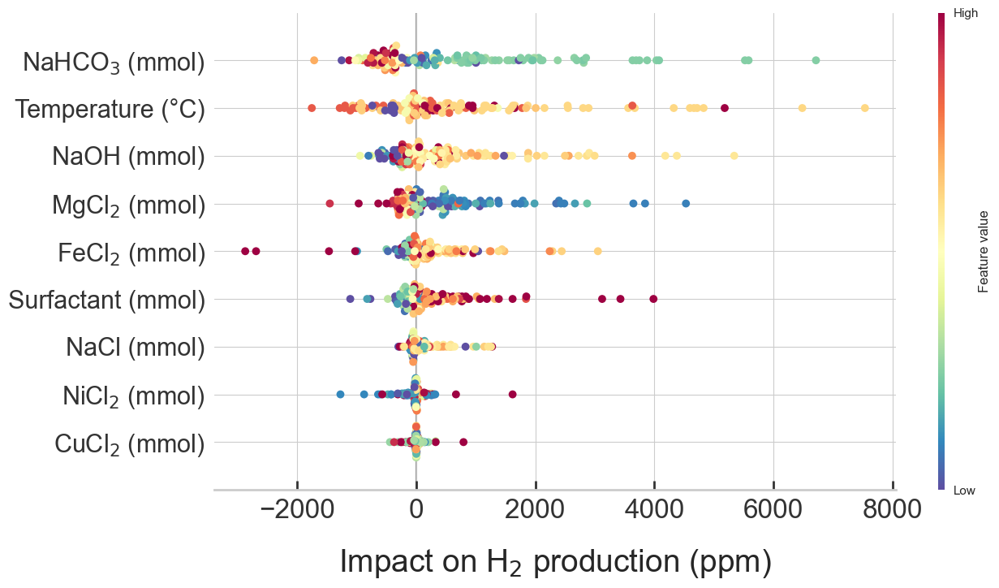


✅ SHAP analysis complete (k-means background)
Stored as: shap_values_gpr_kmeans, SHAP_data_gpr_kmeans, explainer_gpr_kmeans
✅ SHAP analysis complete


In [ ]:
# =========================
# CLEAN SHAP ANALYSIS PIPELINE with k-means background and bootstrap sensitivity analysis
# =========================

import shap
import pandas as pd
from sklearn.cluster import KMeans
from tqdm import trange
from scipy.stats import spearmanr

# Parameters
k_bg = 30
random_seed = 27
np.random.seed(random_seed)

feature_names = ['Temperature (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)',
                 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)',
                 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

# Model wrapper
def model_predict(X):
    y_pred, _ = objective_model.model.predict(X)
    return y_pred.flatten()

# K-means background
kmeans_bg = KMeans(n_clusters=min(k_bg, X_train.shape[0]), random_state=random_seed)
kmeans_bg.fit(X_train)
SHAP_background = kmeans_bg.cluster_centers_
print(f"Using k-means background with {SHAP_background.shape[0]} centroids")

# Create explainer
def make_explainer_and_values(background, data_to_explain):
    try:
        expl = shap.Explainer(model_predict, background, feature_names=feature_names)
        exp = expl(data_to_explain)
        values = exp.values if hasattr(exp, "values") else np.asarray(exp)
        base = exp.base_values if hasattr(exp, "base_values") else None
        return expl, values, base, exp
    except Exception as e:
        print(f"Falling back to KernelExplainer: {e}")
        expl = shap.KernelExplainer(model_predict, background)
        vals = expl.shap_values(data_to_explain)
        if isinstance(vals, list):
            vals = vals[0]
        return expl, np.asarray(vals), expl.expected_value, None

# Compute SHAP values
explainer, shap_values, base_value, shap_exp = make_explainer_and_values(SHAP_background, X_train)
print("SHAP computation complete")

# Background sensitivity analysis
def background_sensitivity(X_train, SHAP_data, n_boot=50, k_bg=30):
    d = X_train.shape[1]
    boot_vals = np.zeros((n_boot, d))
    
    for b in trange(n_boot, desc="Background sensitivity"):
        bs_idx = np.random.choice(X_train.shape[0], size=X_train.shape[0], replace=True)
        X_bs = X_train[bs_idx]
        k_b = min(k_bg, X_bs.shape[0])
        km_b = KMeans(n_clusters=k_b, random_state=random_seed+b).fit(X_bs)
        bg_b = km_b.cluster_centers_
        
        _, vals_b, _, _ = make_explainer_and_values(bg_b, SHAP_data)
        vals_b = np.asarray(vals_b)
        if vals_b.ndim == 3:
            vals_b = vals_b[0]
        if vals_b.shape[1] == d:
            boot_vals[b, :] = np.nanmean(np.abs(vals_b), axis=0)
        else:
            boot_vals[b, :] = np.nan

    median_abs = np.nanmedian(boot_vals, axis=0)
    low95 = np.nanpercentile(boot_vals, 2.5, axis=0)
    high95 = np.nanpercentile(boot_vals, 97.5, axis=0)
    std_abs = np.nanstd(boot_vals, axis=0)
    ci_width = high95 - low95
    relative_ci = ci_width / np.where(median_abs != 0, median_abs, np.nan)

    boot_df = pd.DataFrame({
        "feature": feature_names,
        "median_abs_shap": median_abs,
        "low95": low95,
        "high95": high95,
        "std": std_abs,
        "relative_ci": relative_ci
    }).sort_values("median_abs_shap", ascending=False).reset_index(drop=True)

    boot_df_pub = pd.DataFrame({
        "Feature": boot_df["feature"],
        "Median |SHAP| (ppm)": boot_df["median_abs_shap"].round(1),
        "Bootstrap 95% CI (ppm)": [
            f"{l:.1f}–{h:.1f}"
            for l, h in zip(boot_df["low95"], boot_df["high95"])
        ],
        "Relative CI (%)": (boot_df["relative_ci"] * 100).round(1),
        "Std (ppm)": boot_df["std"].round(1)
    })


    boot_df_pub.to_csv(
        "shap_kmeans_bootstrap_summary_publication.csv",
        index=False
    )
    
    # Print bootstrap summary
    print("\n🎯 SHAP Bootstrap Stability Summary")
    print(
        f"{'Feature':<25} "
        f"{'Median|SHAP| (ppm)':>18} "
        f"{'Bootstrap 95% CI (ppm)':>24} "
        f"{'Std (ppm)':>12}"
        f"{'Rel.CI (%)':>12} "
    )

    for _, row in boot_df.iterrows():

        median = row['median_abs_shap']
        low = row['low95']
        high = row['high95']
        std = row['std']
        rel_ci_pct = row['relative_ci'] * 100

        print(
            f"{row['feature']:<25} "
            f"{median:18.1f} "
            f"{f'{low:.1f}–{high:.1f}':>24} "
            f"{std:12.1f}"
            f"{rel_ci_pct:12.1f} "    
        )
    
    return median_abs, low95, high95, std_abs, relative_ci, boot_df

# Run sensitivity analysis
median_abs, low95, high95, std_abs, relative_ci, boot_df = \
    background_sensitivity(X_train, X_train, n_boot=50, k_bg=k_bg)

# SHAP Consistency check
single_run_mean_abs = np.mean(np.abs(shap_values), axis=0)
consistency_df = pd.DataFrame({
    "feature": feature_names,
    "single_run": single_run_mean_abs,
    "bootstrap_median": median_abs,
    "relative_ci": relative_ci
})
consistency_df["rank_single"] = consistency_df["single_run"].rank(ascending=False)
consistency_df["rank_bootstrap"] = consistency_df["bootstrap_median"].rank(ascending=False)
consistency_df["rank_diff"] = (consistency_df["rank_single"] - consistency_df["rank_bootstrap"]).abs()

rho, pval = spearmanr(consistency_df["single_run"], consistency_df["bootstrap_median"])
print(f"\n📊 SHAP consistency check (single-run vs bootstrap median):")
print(f"Spearman rho = {rho:.3f} (p = {pval:.3g})")

consistency_df.to_csv("shap_consistency_check.csv", index=False)

# Beeswarm plot
def plot_beeswarm(shap_exp, feature_names, figsize=(14,8)):
    load_plt_setting()
    fig, ax = plt.subplots(figsize=figsize)
    try:
        shap.plots.beeswarm(shap_exp, show=False, plot_size=(14,8), s=50, color='Spectral_r')
        fig, ax = plt.gcf(), plt.gca()
    except:
        plot_data = shap_exp.values if hasattr(shap_exp, 'values') else shap_exp
        shap.summary_plot(plot_data, X_train, feature_names=feature_names,
                          plot_type='dot', cmap='Spectral_r', show=False)
        fig, ax = plt.gcf(), plt.gca()
    
    ax.set_xlabel('Impact on H$_2$ production (ppm)', fontsize=28, labelpad=20)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=6))
    ax.tick_params(axis='both',direction='in',length=8,width=2,labelsize=24)
    ax.set_ylabel('')
    ax.tick_params(axis='y', labelsize=22)
    
    plt.tight_layout()
    #Define output folder for saving beeswarm plot
    output_folder = ''
    plt.savefig(os.path.join(output_folder, 'SHAP_beeswarm_plot.tiff'), dpi=600, bbox_inches='tight')
    plt.show()

plot_beeswarm(shap_exp, feature_names)

# Save results
pd.DataFrame({
    "feature": feature_names,
    "mean_abs_shap": single_run_mean_abs
}).sort_values("mean_abs_shap", ascending=False).to_csv("shap_summary.csv", index=False)

# Store results for comparison
shap_values_gpr_kmeans = shap_exp
SHAP_data_gpr_kmeans = X_train
explainer_gpr_kmeans = explainer

print("\n✅ SHAP analysis complete (k-means background)")
print("Stored as: shap_values_gpr_kmeans, SHAP_data_gpr_kmeans, explainer_gpr_kmeans")

print("✅ SHAP analysis complete")

Computing SHAP with full background (all samples)...
Using all 133 samples for background and explanation...


ExactExplainer explainer: 134it [00:20,  3.37it/s]                         
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


SHAP computation complete


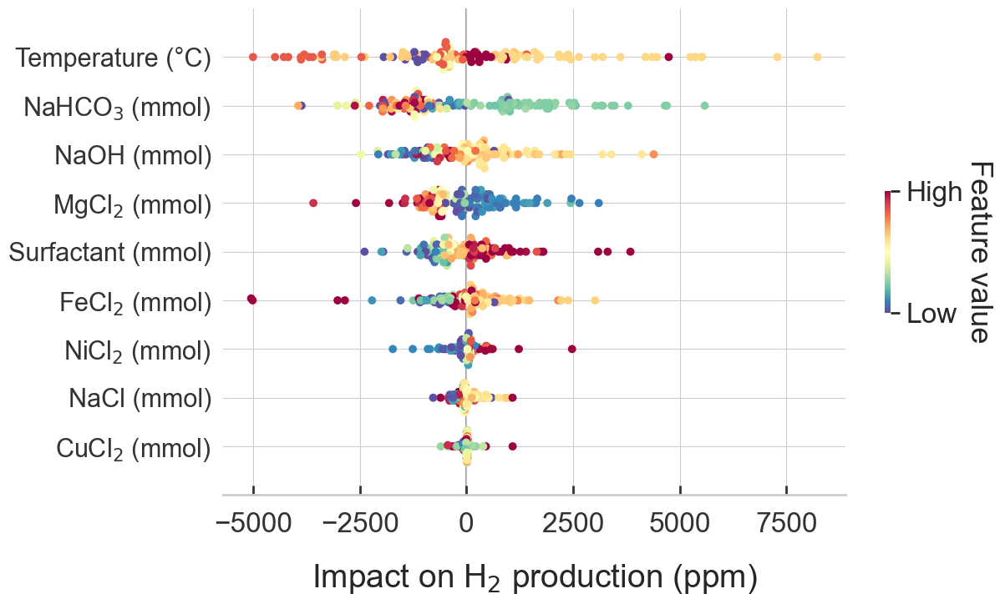


Feature importance (mean |SHAP|):
  1. Temperature (°C)         :   1681.6 ppm
  2. NaHCO$_3$ (mmol)         :   1472.3 ppm
  3. NaOH (mmol)              :    868.4 ppm
  4. MgCl$_2$ (mmol)          :    720.4 ppm
  5. Surfactant (mmol)        :    649.8 ppm
  6. FeCl$_2$ (mmol)          :    627.2 ppm
  7. NiCl$_2$ (mmol)          :    219.1 ppm
  8. NaCl (mmol)              :    205.1 ppm
  9. CuCl$_2$ (mmol)          :     71.6 ppm

✅ SHAP analysis complete (full background)
Stored as: shap_values_gpr_full, SHAP_data_gpr_full, explainer_gpr_full


In [ ]:
# Alternative SHAP analysis using full background (all training samples).

import shap

# Model wrapper
def model_predict(X):
    y_pred, _ = objective_model.model.predict(X)
    return y_pred.flatten()

np.random.seed(27)

feature_names = ['Temperature (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)',
                 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)',
                 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

print("Computing SHAP with full background (all samples)...")

# Use ALL training data as background and for explanation
# (Alternative: use k-means subset for faster computation)
SHAP_background = X_train
SHAP_data = X_train

print(f"Using all {X_train.shape[0]} samples for background and explanation...")

# Create explainer
try:
    explainer = shap.Explainer(model_predict, SHAP_background, feature_names=feature_names)
    shap_exp = explainer(SHAP_data)
    print("SHAP computation complete")
except Exception as e:
    print(f"Falling back to KernelExplainer: {e}")
    explainer = shap.KernelExplainer(model_predict, SHAP_background)
    shap_vals = explainer.shap_values(SHAP_data)
    if isinstance(shap_vals, list):
        shap_vals = shap_vals[0]
    shap_exp = shap.Explanation(
        values=shap_vals,
        base_values=explainer.expected_value,
        data=SHAP_data,
        feature_names=feature_names
    )

# Create beeswarm plot
load_plt_setting()

try:
    shap.plots.beeswarm(shap_exp, show=False, plot_size=(14,8), s=50, color='Spectral_r')
    fig, ax = plt.gcf(), plt.gca()
except Exception as e:
    print(f"Beeswarm failed, using summary plot: {e}")
    fig, ax = plt.subplots(figsize=(14, 8))
    plot_data = shap_exp.values if hasattr(shap_exp, 'values') else shap_exp
    feature_data = shap_exp.data if hasattr(shap_exp, 'data') else SHAP_data
    shap.summary_plot(plot_data, feature_data, feature_names=feature_names,
                      plot_type='dot', cmap='Spectral_r', show=False, max_display=9)
    fig, ax = plt.gcf(), plt.gca()

# Format plot
ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=6))
ax.tick_params(axis='both', direction='in', length=8, width=2, pad=15, labelsize=24)
ax.set_xlabel('Impact on H$_2$ production (ppm)', labelpad=20, fontsize=28)
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=22, pad=10)

# Handle colorbar
if len(fig.axes) > 1:
    try:
        cbar_ax = fig.axes[1]
        if hasattr(cbar_ax, 'get_ylabel') and 'feature value' in cbar_ax.get_ylabel().lower():
            cbar_ax.set_aspect(20)
            cbar_ax.tick_params(axis='y', direction='out', length=8, width=2, pad=5, labelsize=24)
            cbar_ax.set_ylabel('Feature value', labelpad=25, rotation=-90, fontsize=26)
    except:
        pass

plt.tight_layout()
plt.subplots_adjust(left=0.3)

#Define output folder for saving beeswarm plot
output_folder = ''
plt.savefig(os.path.join(output_folder, 'SHAP_beeswarm_full_background.tiff'), dpi=600, bbox_inches='tight')
plt.show()

# Feature importance
shap_vals = shap_exp.values if hasattr(shap_exp, 'values') else shap_exp
mean_abs_shap = np.mean(np.abs(shap_vals), axis=0)
importance_order = np.argsort(mean_abs_shap)[::-1]

print("\nFeature importance (mean |SHAP|):")
for i, idx in enumerate(importance_order):
    print(f"  {i+1}. {feature_names[idx]:<25}: {mean_abs_shap[idx]:>8.1f} ppm")

# Store results for comparison
shap_values_gpr_full = shap_exp
SHAP_data_gpr_full = SHAP_data
explainer_gpr_full = explainer

print("\n✅ SHAP analysis complete (full background)")
print("Stored as: shap_values_gpr_full, SHAP_data_gpr_full, explainer_gpr_full")

# 3. Shapley feature correlation with GPR (k-means centroids)

### 3.1 GPR Shapley feature correlation (k-means)

In [9]:
import numpy as np

print("Preparing GPR SHAP data for correlation analysis")

# Choose which GPR SHAP to use
# Option 1: K-means background (default)
shap_values_gpr = shap_values_gpr_kmeans
X_analysis_gpr = SHAP_data_gpr_kmeans
method_name = "K-means"

# Option 2: Full background (uncomment to use)
# shap_values_gpr = shap_values_gpr_full
# X_analysis_gpr = SHAP_data_gpr_full
# method_name = "Full"

# Feature names
feature_names = ['Temperature (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)',
                 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)',
                 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

print(f"Using {method_name} background")
print(f"SHAP values shape: {shap_values_gpr.values.shape if hasattr(shap_values_gpr, 'values') else shap_values_gpr.shape}")
print(f"Data shape: {X_analysis_gpr.shape}")

# Get baseline
if hasattr(shap_values_gpr, 'base_values'):
    baseline_gpr = float(shap_values_gpr.base_values[0]) if hasattr(shap_values_gpr.base_values, '__len__') else float(shap_values_gpr.base_values)
else:
    baseline_predictions, _ = objective_model.model.predict(X_analysis_gpr)
    baseline_gpr = np.mean(baseline_predictions)

print(f"GPR baseline H₂: {baseline_gpr:.1f} ppm")
print("✅ Ready for correlation analysis")

Preparing GPR SHAP data for correlation analysis
Using K-means background
SHAP values shape: (133, 9)
Data shape: (133, 9)
GPR baseline H₂: 1535.4 ppm
✅ Ready for correlation analysis


Unnormalized plots

Creating GPR SHAP correlation plots
SHAP values shape: (133, 9)
Feature data shape: (133, 9)

Top 3 features by SHAP importance:
  NaHCO$_3$ (M): 1056.0 ppm
  Temperature (°C): 1023.2 ppm
  NaOH (M): 707.3 ppm

Generating 72 correlation plots (saving all, displaying top features only)...


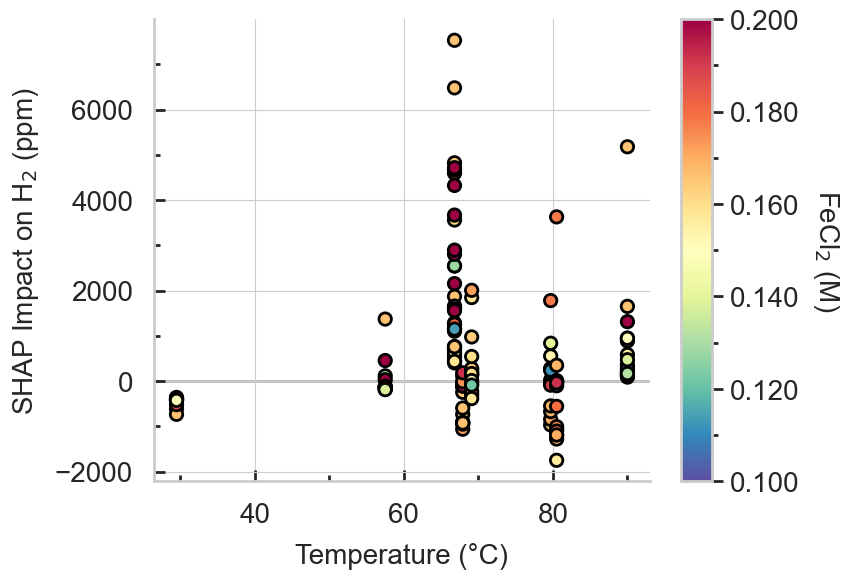

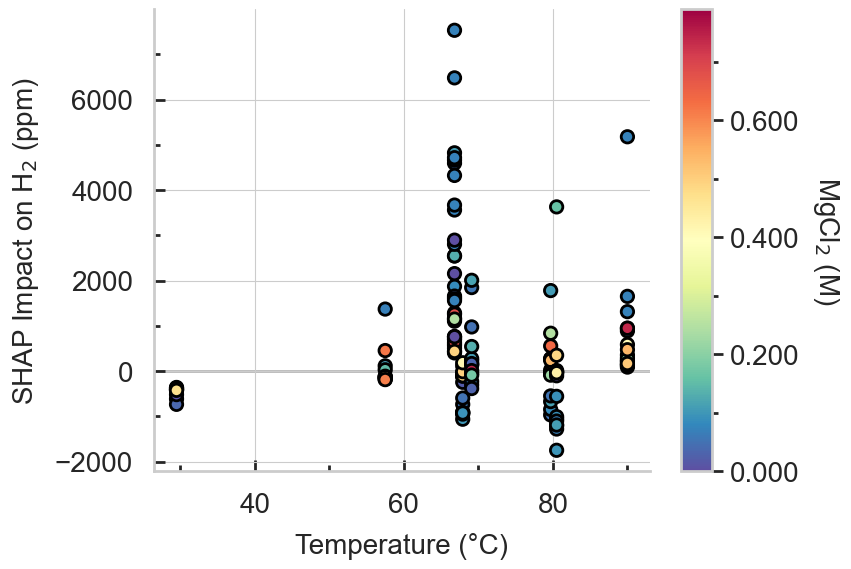

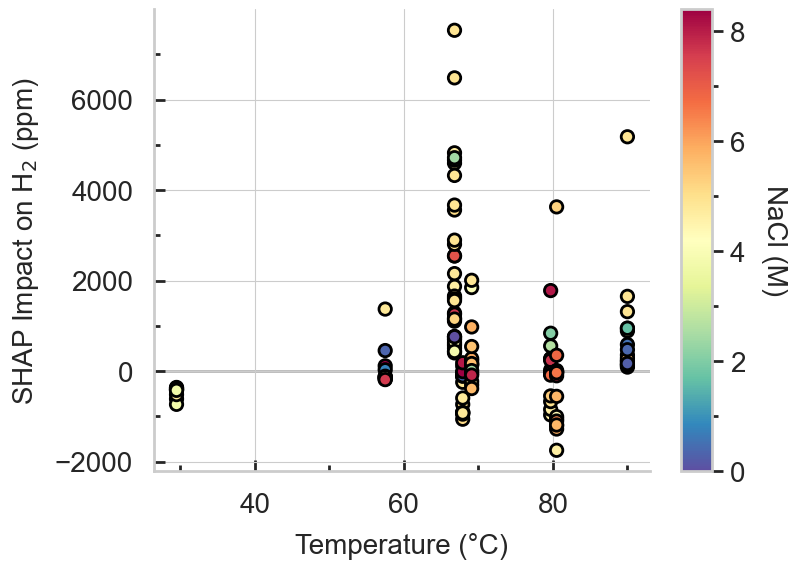

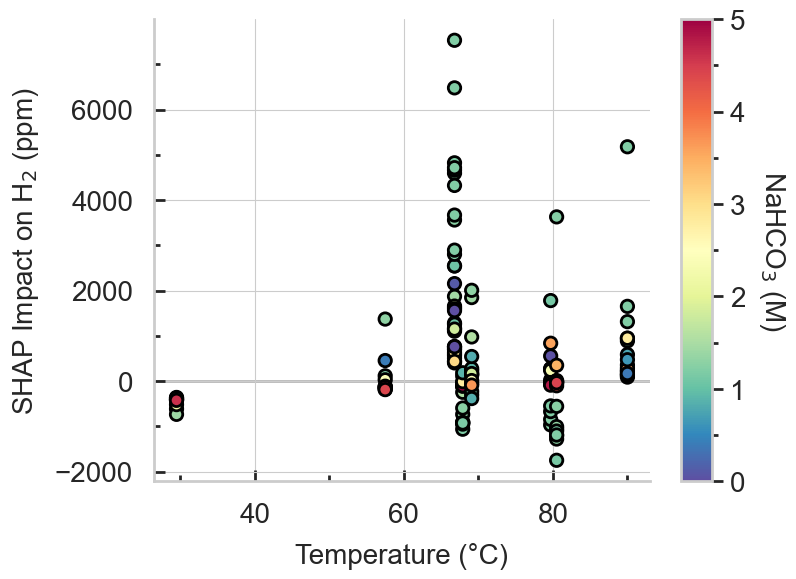

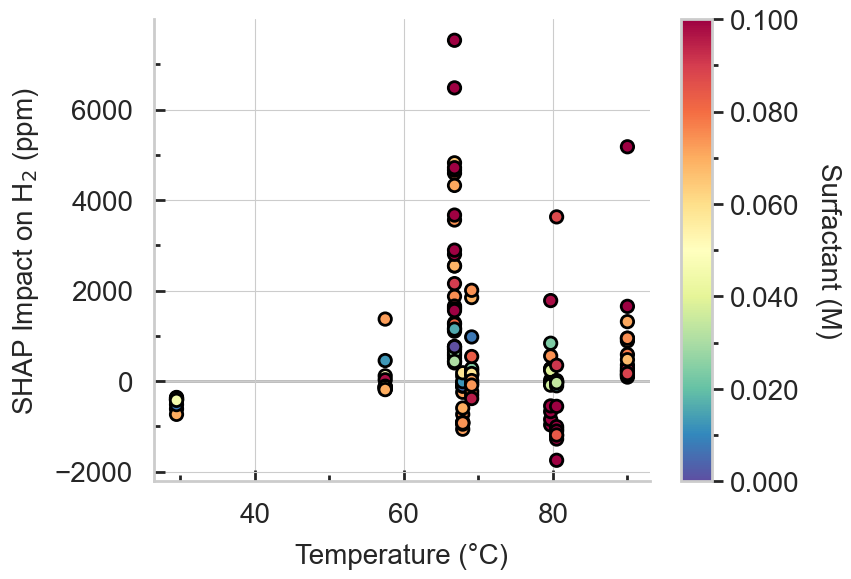

...

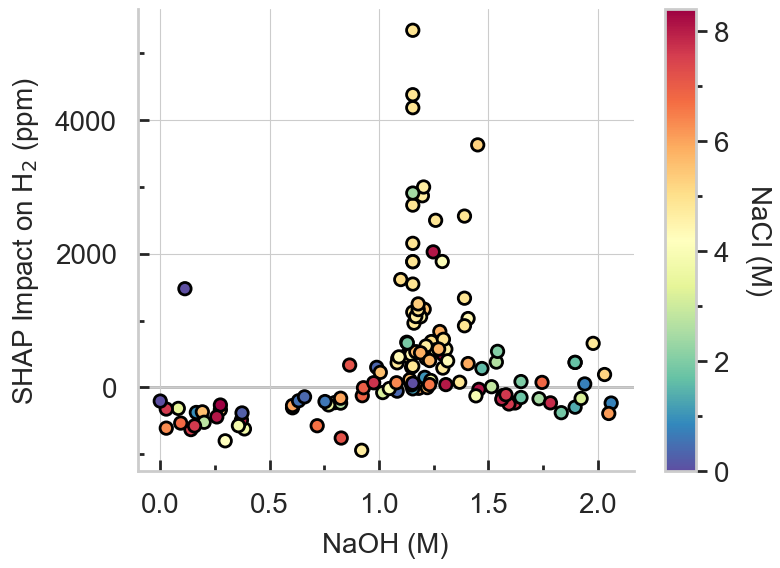

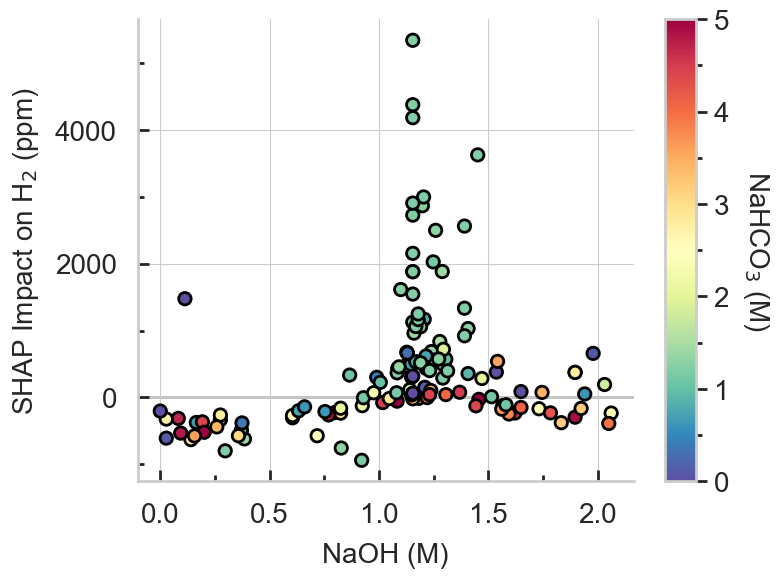

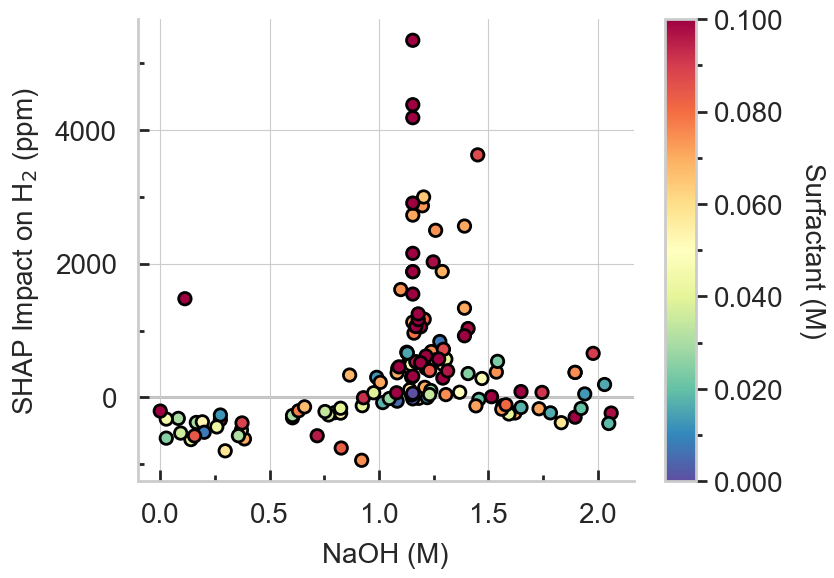

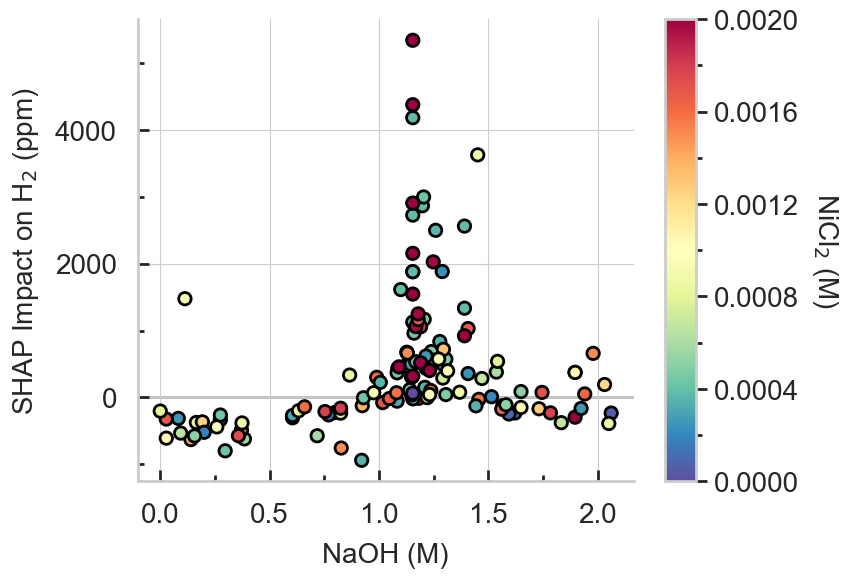

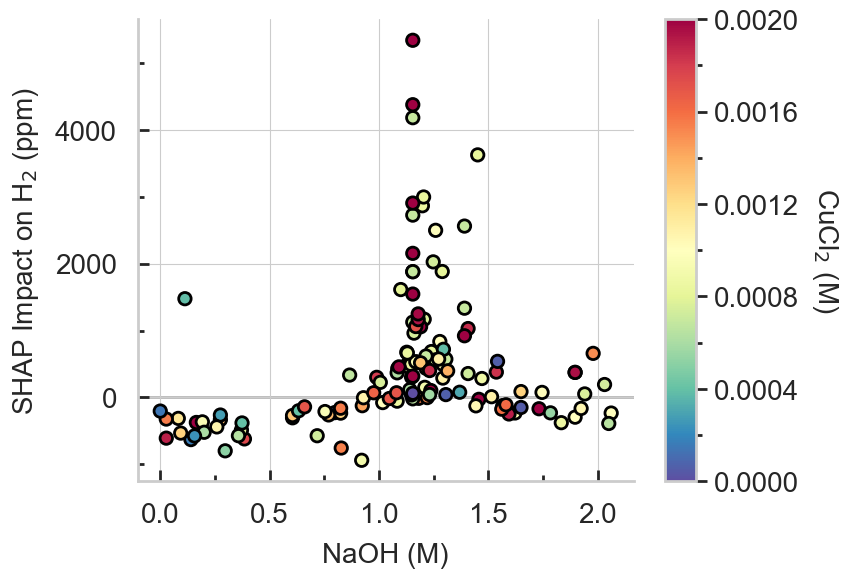


✅ Saved 72 GPR SHAP correlation plots
📊 Displayed 42 plots (top features only)
💾 All 72 plots saved to: /Users/nickyevans17/Library/CloudStorage/OneDrive-MassachusettsInstituteofTechnology/PostDoc_MIT_2024-/Collaboration work (Sept 2025 -/Abhishek_Abate_Catalysis work - Sept 2025/Figures for paper/GPRcorrelationPlots


In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

load_plt_setting()

print("Creating GPR SHAP correlation plots")

# Extract SHAP values
if hasattr(shap_values_gpr, 'values'):
    y_gpr = shap_values_gpr.values
else:
    y_gpr = shap_values_gpr

x_normalized_gpr = X_analysis_gpr

print(f"SHAP values shape: {y_gpr.shape}")
print(f"Feature data shape: {x_normalized_gpr.shape}")

# Feature information with actual ranges
feature_info = {
    0: {'min': 25, 'max': 90, 'name': 'Temperature', 'unit': '°C'},
    1: {'min': 0.1, 'max': 0.2, 'name': 'FeCl$_2$', 'unit': 'M'},
    2: {'min': 0, 'max': 0.8, 'name': 'MgCl$_2$', 'unit': 'M'},
    3: {'min': 0, 'max': 8.5, 'name': 'NaCl', 'unit': 'M'},
    4: {'min': 0, 'max': 5.0, 'name': 'NaHCO$_3$', 'unit': 'M'},
    5: {'min': 0, 'max': 0.1, 'name': 'Surfactant', 'unit': 'M'},
    6: {'min': 0, 'max': 0.002, 'name': 'NiCl$_2$', 'unit': 'M'},
    7: {'min': 0, 'max': 0.002, 'name': 'CuCl$_2$', 'unit': 'M'},
    8: {'min': 0, 'max': 2.05, 'name': 'NaOH', 'unit': 'M'}
}

def denormalize_feature(normalized_values, feature_idx):
    """Convert normalized [0,1] values back to original scale"""
    min_val = feature_info[feature_idx]['min']
    max_val = feature_info[feature_idx]['max']
    return normalized_values * (max_val - min_val) + min_val

def get_feature_label(feature_idx):
    """Get formatted feature label with units"""
    return f"{feature_info[feature_idx]['name']} ({feature_info[feature_idx]['unit']})"

def get_clean_filename(feature_idx_i, feature_idx_j):
    """Generate clean filename from feature names"""
    name_i = feature_info[feature_idx_i]['name'].replace('$', '').replace('_', '')
    name_j = feature_info[feature_idx_j]['name'].replace('$', '').replace('_', '')
    return f'GPR_SHAP_{name_i}_vs_{name_j}.tiff'

# Denormalize all features
num_features = x_normalized_gpr.shape[1]
x_original_gpr = np.zeros_like(x_normalized_gpr)

for i in range(num_features):
    x_original_gpr[:, i] = denormalize_feature(x_normalized_gpr[:, i], i)

# Identify top 3 features for display filtering
feature_importance_gpr = np.mean(np.abs(y_gpr), axis=0)
top_features_gpr = np.argsort(feature_importance_gpr)[-3:]

print(f"\nTop 3 features by SHAP importance:")
for idx in top_features_gpr[::-1]:
    print(f"  {get_feature_label(idx)}: {feature_importance_gpr[idx]:.1f} ppm")

#Define output folder for saving correlation plots
output_folder = ''
os.makedirs(output_folder, exist_ok=True)

# Settings
show_only_top_features = True  # Only display top-feature plots
total_plots = num_features * (num_features - 1)
print(f"\nGenerating {total_plots} correlation plots (saving all, displaying top features only)...")

plot_count = 0
displayed_count = 0

for i in range(num_features):
    for j in range(num_features):
        if i == j:
            continue
        
        # Determine if this plot should be displayed
        should_display = not show_only_top_features or (i in top_features_gpr or j in top_features_gpr)
        
        fig, ax = plt.subplots(figsize=(8, 6))
        
        # Scatter plot: x-axis = feature i, y-axis = SHAP for feature i, color = feature j
        mat = ax.scatter(x_original_gpr[:, i], y_gpr[:, i], s=80, 
                        edgecolor="black", linewidth=2, clip_on=False,
                        c=x_original_gpr[:, j], cmap='Spectral_r', zorder=10)
        
        # Tick formatting
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 5, 10]))
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 5, 10]))
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        ax.tick_params(axis='both', direction='in', length=8, width=2, pad=15, labelsize=20)
        ax.tick_params(axis='both', which='minor', direction='in', length=4, width=2, pad=15)
        
        # Labels
        ax.set_xlabel(get_feature_label(i), labelpad=10, fontsize=20)
        ax.set_ylabel(r'SHAP Impact on H$_2$ (ppm)', labelpad=10, fontsize=20)
        
        # Axis limits with padding
        x_min, x_max = x_original_gpr[:, i].min(), x_original_gpr[:, i].max()
        y_min, y_max = y_gpr[:, i].min(), y_gpr[:, i].max()
        
        x_range = x_max - x_min if x_max != x_min else 0.001
        y_range = y_max - y_min if y_max != y_min else 0.1
        
        ax.set_xlim([x_min - 0.05*x_range, x_max + 0.05*x_range])
        ax.set_ylim([y_min - 0.05*y_range, y_max + 0.05*y_range])
        
        # Remove top/right spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Zero reference line
        ax.hlines(y=0, xmin=x_min - 0.05*x_range, xmax=x_max + 0.05*x_range, 
                  color='#999999', linewidth=2, zorder=-1, alpha=0.7)
        
        # Colorbar
        cbar = fig.colorbar(mat, aspect=15)
        cbar.ax.tick_params(axis='y', direction='out', length=8, width=2, pad=5, labelsize=20)
        cbar.ax.tick_params(axis='y', which='minor', direction='out', length=4, width=2, pad=5)
        cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 4, 5, 10]))
        cbar.ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        cbar.ax.set_ylabel(get_feature_label(j), labelpad=30, rotation=-90, fontsize=20)
        
        # Format small values
        if feature_info[j]['max'] <= 0.01:
            cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
        elif feature_info[j]['max'] <= 1:
            cbar.ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.3f'))
        
        if feature_info[i]['max'] <= 0.01:
            ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
        elif feature_info[i]['max'] <= 1:
            ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.3f'))
        
        # Save ALL plots
        filename = get_clean_filename(i, j)
        plt.savefig(os.path.join(output_folder, filename), dpi=600, bbox_inches='tight')
        
        # Display only top-feature plots
        if should_display:
            plt.show()
            displayed_count += 1
        
        plt.close(fig)
        plot_count += 1

print(f"\n✅ Saved {plot_count} GPR SHAP correlation plots")
print(f"📊 Displayed {displayed_count} plots (top features only)")
print(f"💾 All {plot_count} plots saved to: {output_folder}")

Normalized plots

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

load_plt_setting()

print("Creating GPR SHAP correlation plots (normalized, top features only)")

# Extract SHAP values
if hasattr(shap_values_gpr, 'values'):
    y_gpr = shap_values_gpr.values
else:
    y_gpr = shap_values_gpr

x_normalized_gpr = X_analysis_gpr

print(f"SHAP values shape: {y_gpr.shape}")
print(f"Feature data shape: {x_normalized_gpr.shape}")

# Feature names
feature_names = ['Temperature (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)',
                 'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)',
                 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

# Identify top 3 features
feature_importance_gpr = np.mean(np.abs(y_gpr), axis=0)
top_features_gpr = np.argsort(feature_importance_gpr)[-3:]

print(f"Top 3 features by SHAP importance:")
for idx in top_features_gpr[::-1]:
    print(f"  {feature_names[idx]}: {feature_importance_gpr[idx]:.1f} ppm")

# Plot settings
create_all_plots = False  # Set to True for all 72 plots
num_features = x_normalized_gpr.shape[1]
plot_count = 0

for i in range(num_features):
    for j in range(num_features):
        if i == j:
            continue
        
        # Skip low-importance pairs
        if not create_all_plots:
            if i not in top_features_gpr and j not in top_features_gpr:
                continue
        
        fig, ax = plt.subplots(figsize=(8, 6))
        
        # Scatter plot
        mat = ax.scatter(x_normalized_gpr[:, i], y_gpr[:, i], s=80, 
                        edgecolor="black", linewidth=2, clip_on=False,
                        c=x_normalized_gpr[:, j], cmap='Spectral_r', zorder=10)
        
        # Tick formatting
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 5, 10]))
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 5, 10]))
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        ax.tick_params(axis='both', direction='in', length=8, width=2, pad=15, labelsize=26)
        ax.tick_params(axis='both', which='minor', direction='in', length=4, width=2, pad=15)
        
        # Labels
        ax.set_xlabel(f'{feature_names[i]} (normalized)', labelpad=20, fontsize=20)
        ax.set_ylabel(r'SHAP Impact on H$_2$ (ppm)', labelpad=20, fontsize=20)
        
        # Axis limits
        x_min, x_max = x_normalized_gpr[:, i].min(), x_normalized_gpr[:, i].max()
        y_min, y_max = y_gpr[:, i].min(), y_gpr[:, i].max()
        
        x_range = x_max - x_min if x_max != x_min else 0.001
        y_range = y_max - y_min if y_max != y_min else 0.1
        
        ax.set_xlim([x_min - 0.05*x_range, x_max + 0.05*x_range])
        ax.set_ylim([y_min - 0.05*y_range, y_max + 0.05*y_range])
        
        # Remove top/right spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Zero reference line
        ax.hlines(y=0, xmin=x_min - 0.05*x_range, xmax=x_max + 0.05*x_range, 
                  color='#999999', linewidth=2, zorder=-1, alpha=0.7)
        
        # Colorbar
        cbar = fig.colorbar(mat, aspect=15)
        cbar.ax.tick_params(axis='y', direction='out', length=8, width=2, pad=5, labelsize=24)
        cbar.ax.tick_params(axis='y', which='minor', direction='out', length=4, width=2, pad=5)
        cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=6, steps=[1, 2, 4, 5, 10]))
        cbar.ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))
        cbar.ax.set_ylabel(f'{feature_names[j]} (normalized)', labelpad=50, rotation=-90, fontsize=20)
        
        plt.tight_layout()
        plt.close(fig)
        
        plot_count += 1

print(f"✅ Created {plot_count} normalized GPR SHAP correlation plots")

Creating GPR SHAP correlation plots (normalized, top features only)
SHAP values shape: (133, 9)
Feature data shape: (133, 9)
Top 3 features by SHAP importance:
  NaHCO$_3$ (mmol): 1056.0 ppm
  Temperature (°C): 1023.2 ppm
  NaOH (mmol): 707.3 ppm
✅ Created 42 normalized GPR SHAP correlation plots


# 4.SHAP-IQ coupled feature analysis plots

### 4.1 SHAP-IQ coupled feature analysis plots using GPR model

In [ ]:
# ==============================
# SHAP-IQ ANALYSIS: ALL 133 SAMPLES WITH k-SII
# ==============================

import numpy as np
import random
import os
import copy
import math
import matplotlib as mpl
import matplotlib.pyplot as plt
import shapiq

# ==============================
# REPRODUCIBILITY SETUP
# ==============================
RANDOM_SEED = 27
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Set framework-specific seeds if available
try:
    import tensorflow as tf
    tf.random.set_seed(RANDOM_SEED)
except ImportError:
    pass

try:
    import torch
    torch.manual_seed(RANDOM_SEED)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(RANDOM_SEED)
except ImportError:
    pass

print(f"🎲 Random seed set to: {RANDOM_SEED}")

# ==============================
# OUTPUT DIRECTORY SETUP
# ==============================
#Define output folder for saving SHAP-IQ GPR plots
save_folder = ""
os.makedirs(save_folder, exist_ok=True)
print(f"📁 Output directory: {save_folder}")

# ==============================
# DATA AND MODEL SETUP
# ==============================
# Store GPR SHAP values for this analysis
shap_values_gpr_kmeans = shap_exp
SHAP_data_gpr_kmeans = X_train
explainer_gpr_kmeans = explainer

X_analysis_gpr = SHAP_data_gpr_kmeans

def model_predict(X):
    """Prediction function for SHAP analysis"""
    y_pred, _ = objective_model.model.predict(X)
    return y_pred.flatten()

# Feature configuration
feature_names_9 = ['Temperature (°C)', 'FeCl$_2$ (mmol)', 'MgCl$_2$ (mmol)', 'NaCl (mmol)',
                   'NaHCO$_3$ (mmol)', 'Surfactant (mmol)', 'NiCl$_2$ (mmol)', 'CuCl$_2$ (mmol)', 'NaOH (mmol)']

data_range = [[25,90], [0.1,0.2], [0,0.8], [0,8.5], [0,5.0], [0,0.1], [0,0.002], [0,0.002], [0,2.05]]

def denormalize_value(normalized_val, feature_idx, ranges):
    """Convert normalized [0,1] value back to original scale"""
    min_val, max_val = ranges[feature_idx]
    return normalized_val * (max_val - min_val) + min_val

num_samples = min(133, X_analysis_gpr.shape[0])
print(f"📊 Processing {num_samples} samples with 9 features")

# ==============================
# PRE-COMPUTE GLOBAL COLOR SCALE
# ==============================
print("\n🔍 Pre-computing SHAP values for global color scale...")
all_interaction_values = []
global_vmax = 0

for sample_id in range(num_samples):
    sample_seed = RANDOM_SEED + sample_id
    np.random.seed(sample_seed)

    explainer_shapiq = shapiq.Explainer(
        model=model_predict,
        data=X_analysis_gpr,
        index="k-SII",
        max_order=2,
        random_state=sample_seed
    )

    interaction_values = explainer_shapiq.explain(X_analysis_gpr[sample_id], budget=2048)
    all_interaction_values.append(interaction_values)

    order_1st = interaction_values.get_n_order_values(1)
    order_2nd = interaction_values.get_n_order_values(2)

    sample_vmax = max(np.max(abs(order_2nd)), np.max(abs(order_1st)))
    global_vmax = max(global_vmax, sample_vmax)
    
    if (sample_id + 1) % 20 == 0 or (sample_id + 1) == num_samples:
        print(f"  Scanned {sample_id + 1}/{num_samples} samples")

print(f"🎨 Global vmax = {global_vmax:.2f}")

# ==============================
# GENERATE POLAR PLOTS
# ==============================
successful_samples = 0
failed_samples = 0
total_error = 0
cmap = copy.copy(plt.cm.Spectral_r)

# Plot layout parameters
node_radius = 0.8
label_radius = 1.0
plot_limit = 0.8
angles = np.linspace(0, -2*np.pi, 9, endpoint=False)

for sample_id in range(num_samples):
    try:
        print(f"\n🔄 Processing Sample {sample_id+1}/{num_samples}...")

        # Load pre-computed values
        interaction_values = all_interaction_values[sample_id]
        baseline_corrected = interaction_values.baseline_value

        order_1st = interaction_values.get_n_order_values(1)
        order_2nd = interaction_values.get_n_order_values(2)

        # Calculate prediction
        shap_1st_sum = np.sum(order_1st)
        shap_2nd_sum = np.sum(order_2nd[np.triu_indices_from(order_2nd, k=1)])
        total_shap_contribution = shap_1st_sum + shap_2nd_sum
        predicted_value = baseline_corrected + total_shap_contribution

        # Verify prediction
        actual_prediction = model_predict(X_analysis_gpr[sample_id:sample_id+1])[0]
        prediction_error = abs(predicted_value - actual_prediction)
        total_error += prediction_error

        # Setup plot
        fig, ax = plt.subplots(figsize=(15, 12.5), subplot_kw={"projection": "polar"})
        ax.set_theta_offset(1 * np.pi / 2)

        # Normalize for visualization
        vmax = global_vmax if global_vmax > 0 else 1
        order_1st_norm = order_1st / vmax
        order_2nd_norm = order_2nd / vmax

        # Plot second-order interactions
        for i in range(9):
            for j in range(i + 1, 9):
                ax.plot([angles[i], angles[j]], [node_radius, node_radius],
                       linewidth=max(2, abs(order_2nd_norm[i,j])*35),
                       linestyle='solid',
                       color=cmap(order_2nd_norm[i,j]/2+0.5),
                       solid_capstyle='round', alpha=0.9)

                # Interaction label positioning
                y_cal = 0.1 if abs(math.cos(abs((angles[i]-angles[j])/2))) < 0.5 else 0
                order_2nd_label = '0' if np.round(order_2nd[i,j], 0) == 0 else f'{order_2nd[i,j]:.0f}'
                label_distance = node_radius * 1.0

                if math.cos(abs((angles[i]-angles[j])/2)) > 0:
                    ax.text((angles[i]+angles[j])/2,
                           math.cos(abs((angles[i]-angles[j])/2))*label_distance+y_cal,
                           order_2nd_label, ha='center', va='center', size=24)
                else:
                    ax.text((angles[i]+angles[j])/2-np.pi,
                           -math.cos(abs((angles[i]-angles[j])/2))*label_distance+y_cal,
                           order_2nd_label, ha='center', va='center', size=24)

        # Plot first-order effects
        mat = ax.scatter(angles, [node_radius]*9, cmap=cmap, c=order_1st,
                        s=abs(order_1st_norm)*2000, clip_on=False, zorder=100,
                        linewidths=2, edgecolors='black', vmax=vmax, vmin=-vmax)

        # Colorbar
        cbar = plt.colorbar(mat, ax=ax, shrink=0.6, pad=0.25, aspect=20)
        cbar.set_label('Influence on H$_2$ (ppm)', rotation=270, labelpad=30, fontsize=20)
        cbar.ax.tick_params(labelsize=16)
        cbar_ticks = np.linspace(-vmax, vmax, 5)
        cbar.set_ticks(cbar_ticks)
        cbar.set_ticklabels([f'{tick:.0f}' for tick in cbar_ticks])

        # Feature labels
        label_y_cal = [0, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08]
        for i, label in enumerate(feature_names_9):
            influence = f'\n+{order_1st[i]:.0f} ppm' if order_1st[i] >= 0 else f'\n{order_1st[i]:.0f} ppm'
            
            normalized_value = X_analysis_gpr[sample_id, i]
            original_value = denormalize_value(normalized_value, i, data_range)
            unit = '°C' if 'Temperature' in label else 'mmol'

            ax.text(angles[i], label_radius+label_y_cal[i],
                   f'{label.split(" (")[0]}\n{original_value:.3g} {unit}{influence}',
                   ha='center', va='center', size=28, rotation=0, zorder=200)

        # Center prediction
        ax.text(0, 0, f'H$_2$\n{predicted_value:.0f} ppm', fontweight='bold',
               ha='center', va='center', size=26, rotation=0, zorder=200)

        # Center circle
        circle = mpl.patches.Circle((0, 0), 0.20, transform=ax.transData._b,
                                   zorder=10, linewidth=2, edgecolor='black',
                                   facecolor=None, alpha=0.1, fill=False)
        ax.add_artist(circle)

        # Clean up axes
        ax.set_ylim([0, plot_limit])
        ax.xaxis.grid(False)
        ax.yaxis.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.spines["start"].set_color("none")

        # Save plot
        filename = f'k-SII_shapiq_polar_sample_{sample_id+1:03d}.png'
        filepath = os.path.join(save_folder, filename)
        plt.tight_layout()
        plt.savefig(filepath, dpi=300, bbox_inches='tight', facecolor='white', pad_inches=0.5)
        plt.close()

        successful_samples += 1

        if (sample_id + 1) % 20 == 0 or (sample_id + 1) == num_samples:
            avg_error = total_error / max(1, successful_samples)
            print(f"✅ Completed {successful_samples}/{num_samples} | Avg Error: {avg_error:.3f} ppm")

    except Exception as e:
        failed_samples += 1
        print(f"❌ Sample {sample_id+1} failed: {e}")
        continue

# ==============================
# SUMMARY
# ==============================
print(f"\n{'='*60}")
print(f"✅ SHAP-IQ polar plot generation complete!")
print(f"{'='*60}")
print(f"📊 Results: {successful_samples}/{num_samples} successful")
print(f"   Failed: {failed_samples}")
print(f"   Avg prediction error: {total_error/max(1, successful_samples):.3f} ppm")
print(f"   Method: k-SII with global color scale")
print(f"   Random seed: {RANDOM_SEED}")
print(f"📁 Saved to: {save_folder}")

🎲 Random seed set to: 27
📁 Output directory: /Users/nickyevans17/Library/CloudStorage/OneDrive-MassachusettsInstituteofTechnology/PostDoc_MIT_2024-/Collaboration work (Sept 2025 -/Abhishek_Abate_Catalysis work - Sept 2025/Figures for paper/SHAP-IQ GPR plots
📊 Processing 133 samples with 9 features

🔍 Pre-computing SHAP values for global color scale...
  Scanned 20/133 samples
  Scanned 40/133 samples
  Scanned 60/133 samples
  Scanned 80/133 samples
  Scanned 100/133 samples
  Scanned 120/133 samples
  Scanned 133/133 samples
🎨 Global vmax = 6111.07

🔄 Processing Sample 1/133...

🔄 Processing Sample 2/133...

🔄 Processing Sample 3/133...

🔄 Processing Sample 4/133...

🔄 Processing Sample 5/133...

🔄 Processing Sample 6/133...

🔄 Processing Sample 7/133...

🔄 Processing Sample 8/133...

🔄 Processing Sample 9/133...

🔄 Processing Sample 10/133...

🔄 Processing Sample 11/133...

🔄 Processing Sample 12/133...

🔄 Processing Sample 13/133...

🔄 Processing Sample 14/133...

🔄 Processing Sampl

In [11]:
# ==============================
# EXTRACT SHAP-IQ BASELINE VALUE
# ==============================
print("\n" + "="*60)
print("📊 SHAP-IQ BASELINE VALUE")
print("="*60)

# Get baseline from the first sample (all should be identical)
baseline_value = all_interaction_values[0].baseline_value
print(f"Baseline Value E[f(X)]: {baseline_value:.2f} ppm")

# Verify consistency across all samples
all_baselines = [val.baseline_value for val in all_interaction_values]
baseline_min = min(all_baselines)
baseline_max = max(all_baselines)
baseline_std = np.std(all_baselines)

print(f"\nBaseline Statistics:")
print(f"  Min:  {baseline_min:.2f} ppm")
print(f"  Max:  {baseline_max:.2f} ppm")
print(f"  Std:  {baseline_std:.6f} ppm")

if np.allclose(all_baselines, baseline_value, rtol=1e-5):
    print(f"\n✅ Baseline is consistent across all {len(all_baselines)} samples")
else:
    print(f"\n⚠️ Warning: Baseline varies across samples")

print("="*60)


📊 SHAP-IQ BASELINE VALUE
Baseline Value E[f(X)]: 4160.44 ppm

Baseline Statistics:
  Min:  4160.44 ppm
  Max:  4160.44 ppm
  Std:  0.000000 ppm

✅ Baseline is consistent across all 133 samples


### 4.2 SHAP-IQ Variable interaction analysis

In [12]:
# ==============================
# SHAP-IQ DOMINANCE ANALYSIS
# ==============================
import numpy as np

first_order_totals = []
second_order_totals = []
dominance_ratios = []

for interaction_values in all_interaction_values:
    order_1st = interaction_values.get_n_order_values(1)
    order_2nd = interaction_values.get_n_order_values(2)

    # Sum of absolute first-order effects
    sum_first = np.sum(np.abs(order_1st))

    # Sum of absolute second-order effects (upper triangle only)
    upper_indices = np.triu_indices_from(order_2nd, k=1)
    sum_second = np.sum(np.abs(order_2nd[upper_indices]))

    first_order_totals.append(sum_first)
    second_order_totals.append(sum_second)

    # Calculate dominance ratio (avoid division by zero)
    if sum_first > 0:
        dominance_ratios.append(sum_second / sum_first)
    else:
        dominance_ratios.append(np.nan)

# Convert to arrays
first_order_totals = np.array(first_order_totals)
second_order_totals = np.array(second_order_totals)
dominance_ratios = np.array(dominance_ratios)

# Results summary
print("\n" + "="*60)
print("📊 SHAP-IQ DOMINANCE ANALYSIS")
print("="*60)
print(f"Mean |First-order| total:        {np.mean(first_order_totals):.2f} ppm")
print(f"Mean |Second-order| total:       {np.mean(second_order_totals):.2f} ppm")
print(f"Mean interaction ratio (2nd/1st): {np.nanmean(dominance_ratios):.3f}")
print(f"Median interaction ratio:         {np.nanmedian(dominance_ratios):.3f}")

pct_interactions_dominate = np.mean(dominance_ratios > 1) * 100
print(f"\nSamples where interactions dominate (ratio > 1): {pct_interactions_dominate:.1f}%")
print("="*60)


📊 SHAP-IQ DOMINANCE ANALYSIS
Mean |First-order| total:        10446.08 ppm
Mean |Second-order| total:       12877.73 ppm
Mean interaction ratio (2nd/1st): 1.614
Median interaction ratio:         0.914

Samples where interactions dominate (ratio > 1): 42.9%


In [13]:
interaction_dominant_indices = np.where(dominance_ratios > 1)[0]

print(f"Number of interaction-dominant samples: {len(interaction_dominant_indices)}")


Number of interaction-dominant samples: 57


In [14]:
# Number of features
n_features = len(feature_names_9)

# Matrix to accumulate absolute interaction magnitudes
interaction_accumulator = np.zeros((n_features, n_features))

for idx in interaction_dominant_indices:
    order_2nd = all_interaction_values[idx].get_n_order_values(2)
    interaction_accumulator += np.abs(order_2nd)

# Only look at upper triangle (unique pairs)
upper_indices = np.triu_indices(n_features, k=1)

pair_magnitudes = interaction_accumulator[upper_indices]

# Map back to feature names
feature_pairs = [
    (feature_names_9[i], feature_names_9[j])
    for i, j in zip(*upper_indices)
]

# Sort by magnitude
sorted_pairs = sorted(
    zip(feature_pairs, pair_magnitudes),
    key=lambda x: x[1],
    reverse=True
)

print("\nTop 10 Dominant Interaction Pairs (in interaction-dominant samples):\n")
for pair, magnitude in sorted_pairs[:10]:
    print(f"{pair[0]}  ×  {pair[1]}  →  Total |Interaction| = {magnitude:.2f}")



Top 10 Dominant Interaction Pairs (in interaction-dominant samples):

NaHCO$_3$ (mmol)  ×  NaOH (mmol)  →  Total |Interaction| = 82091.48
Temperature (°C)  ×  NaHCO$_3$ (mmol)  →  Total |Interaction| = 77312.49
MgCl$_2$ (mmol)  ×  NaHCO$_3$ (mmol)  →  Total |Interaction| = 66991.88
Temperature (°C)  ×  NaOH (mmol)  →  Total |Interaction| = 64330.88
MgCl$_2$ (mmol)  ×  NaOH (mmol)  →  Total |Interaction| = 52839.60
NaHCO$_3$ (mmol)  ×  Surfactant (mmol)  →  Total |Interaction| = 52801.17
Temperature (°C)  ×  FeCl$_2$ (mmol)  →  Total |Interaction| = 49629.99
FeCl$_2$ (mmol)  ×  NaOH (mmol)  →  Total |Interaction| = 49048.37
FeCl$_2$ (mmol)  ×  NaHCO$_3$ (mmol)  →  Total |Interaction| = 47879.80
Temperature (°C)  ×  Surfactant (mmol)  →  Total |Interaction| = 47129.65


In [15]:
n_features = len(feature_names_9)

# Containers
signed_accumulator = np.zeros((n_features, n_features))
count_accumulator = np.zeros((n_features, n_features))
positive_count = np.zeros((n_features, n_features))

for idx in interaction_dominant_indices:
    order_2nd = all_interaction_values[idx].get_n_order_values(2)

    for i in range(n_features):
        for j in range(i+1, n_features):
            value = order_2nd[i, j]
            
            signed_accumulator[i, j] += value
            count_accumulator[i, j] += 1
            
            if value > 0:
                positive_count[i, j] += 1

# Compute averages
average_signed = np.divide(
    signed_accumulator,
    count_accumulator,
    out=np.zeros_like(signed_accumulator),
    where=count_accumulator != 0
)

# Compute % positive
percent_positive = np.divide(
    positive_count,
    count_accumulator,
    out=np.zeros_like(positive_count),
    where=count_accumulator != 0
) * 100


In [16]:
upper_indices = np.triu_indices(n_features, k=1)

pair_stats = []

for i, j in zip(*upper_indices):
    pair_stats.append((
        feature_names_9[i],
        feature_names_9[j],
        signed_accumulator[i, j],      # total signed
        average_signed[i, j],          # average signed
        percent_positive[i, j]         # % positive
    ))

# Sort by total absolute signed magnitude
pair_stats_sorted = sorted(
    pair_stats,
    key=lambda x: abs(x[2]),
    reverse=True
)

print("\nTop 10 Interaction Pairs (Signed Behavior in Interaction-Dominant Samples):\n")

for pair in pair_stats_sorted[:10]:
    print(f"{pair[0]} × {pair[1]}")
    print(f"   Total signed interaction: {pair[2]:.2f}")
    print(f"   Average signed interaction: {pair[3]:.2f}")
    print(f"   % Positive interactions: {pair[4]:.1f}%\n")



Top 10 Interaction Pairs (Signed Behavior in Interaction-Dominant Samples):

NaHCO$_3$ (mmol) × NaOH (mmol)
   Total signed interaction: 80809.30
   Average signed interaction: 1417.71
   % Positive interactions: 94.7%

MgCl$_2$ (mmol) × NaHCO$_3$ (mmol)
   Total signed interaction: 64645.53
   Average signed interaction: 1134.13
   % Positive interactions: 96.5%

MgCl$_2$ (mmol) × NaOH (mmol)
   Total signed interaction: 52839.60
   Average signed interaction: 927.01
   % Positive interactions: 100.0%

NaHCO$_3$ (mmol) × Surfactant (mmol)
   Total signed interaction: 51828.44
   Average signed interaction: 909.27
   % Positive interactions: 96.5%

FeCl$_2$ (mmol) × NaOH (mmol)
   Total signed interaction: 43943.26
   Average signed interaction: 770.93
   % Positive interactions: 91.2%

FeCl$_2$ (mmol) × NaHCO$_3$ (mmol)
   Total signed interaction: 37845.38
   Average signed interaction: 663.95
   % Positive interactions: 87.7%

Temperature (°C) × FeCl$_2$ (mmol)
   Total signed inte

Number of interaction-dominant samples: 57


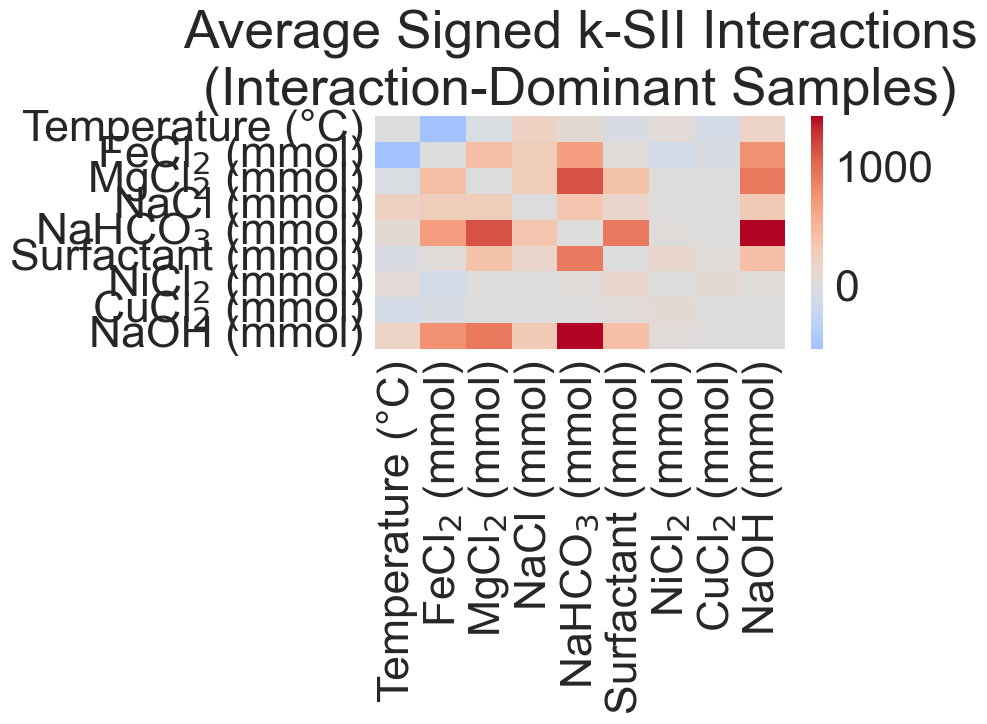


Variable Interaction Participation (Mean |Interaction|):
             feature  mean_abs_interaction_participation
4   NaHCO$_3$ (mmol)                         6327.976346
0   Temperature (°C)                         5862.625673
8        NaOH (mmol)                         5494.084084
2    MgCl$_2$ (mmol)                         4108.684358
1    FeCl$_2$ (mmol)                         4102.625079
5  Surfactant (mmol)                         3458.091497
3        NaCl (mmol)                         1846.916928
6    NiCl$_2$ (mmol)                         1438.886403
7    CuCl$_2$ (mmol)                          734.206707

Variable Frequency in Top 3 Interactions:
             feature  top3_interaction_frequency
4   NaHCO$_3$ (mmol)                        93.0
0   Temperature (°C)                        89.0
8        NaOH (mmol)                        70.0
1    FeCl$_2$ (mmol)                        33.0
2    MgCl$_2$ (mmol)                        27.0
5  Surfactant (mmol)               

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

n_features = len(feature_names_9)
n_samples = len(all_interaction_values)

interaction_ratios = []
dominant_indices = []

# ---- Compute interaction dominance ratio per sample ----
for i in range(n_samples):
    order_1st = all_interaction_values[i].get_n_order_values(1)
    order_2nd = all_interaction_values[i].get_n_order_values(2)

    first_total = np.sum(np.abs(order_1st))
    second_total = np.sum(np.abs(order_2nd[np.triu_indices_from(order_2nd, k=1)]))

    ratio = second_total / first_total if first_total != 0 else 0
    interaction_ratios.append(ratio)

    if ratio > 1:
        dominant_indices.append(i)

interaction_ratios = np.array(interaction_ratios)

print("Number of interaction-dominant samples:", len(dominant_indices))


# ==========================================================
# 1️⃣  AVERAGE SIGNED INTERACTION HEATMAP (Dominant Samples)
# ==========================================================

signed_matrix = np.zeros((n_features, n_features))

for idx in dominant_indices:
    order_2nd = all_interaction_values[idx].get_n_order_values(2)
    signed_matrix += order_2nd

signed_matrix /= len(dominant_indices)
np.fill_diagonal(signed_matrix, 0)

plt.figure(figsize=(10,8))
sns.heatmap(
    signed_matrix,
    xticklabels=feature_names_9,
    yticklabels=feature_names_9,
    cmap="coolwarm",
    center=0
)
plt.title("Average Signed k-SII Interactions\n(Interaction-Dominant Samples)")
plt.tight_layout()
plt.show()


# ==========================================================
# 2️⃣ VARIABLE INTERACTION PARTICIPATION MAGNITUDE
# ==========================================================

participation_magnitude = np.zeros(n_features)

for idx in dominant_indices:
    order_2nd = all_interaction_values[idx].get_n_order_values(2)
    participation_magnitude += np.sum(np.abs(order_2nd), axis=1)

participation_magnitude /= len(dominant_indices)

participation_df = pd.DataFrame({
    "feature": feature_names_9,
    "mean_abs_interaction_participation": participation_magnitude
}).sort_values("mean_abs_interaction_participation", ascending=False)

print("\nVariable Interaction Participation (Mean |Interaction|):")
print(participation_df)


# ==========================================================
# 3️⃣ VARIABLE PARTICIPATION FREQUENCY
# ==========================================================

# Count how often each variable appears in top 3 interactions per dominant sample
participation_frequency = np.zeros(n_features)

for idx in dominant_indices:
    order_2nd = all_interaction_values[idx].get_n_order_values(2)
    upper = np.abs(order_2nd[np.triu_indices_from(order_2nd, k=1)])

    # Get indices of top 3 interactions
    top3_idx = np.argsort(upper)[-3:]

    pairs = list(zip(*np.triu_indices(n_features, k=1)))
    top_pairs = [pairs[i] for i in top3_idx]

    for (i, j) in top_pairs:
        participation_frequency[i] += 1
        participation_frequency[j] += 1

participation_freq_df = pd.DataFrame({
    "feature": feature_names_9,
    "top3_interaction_frequency": participation_frequency
}).sort_values("top3_interaction_frequency", ascending=False)

print("\nVariable Frequency in Top 3 Interactions:")
print(participation_freq_df)


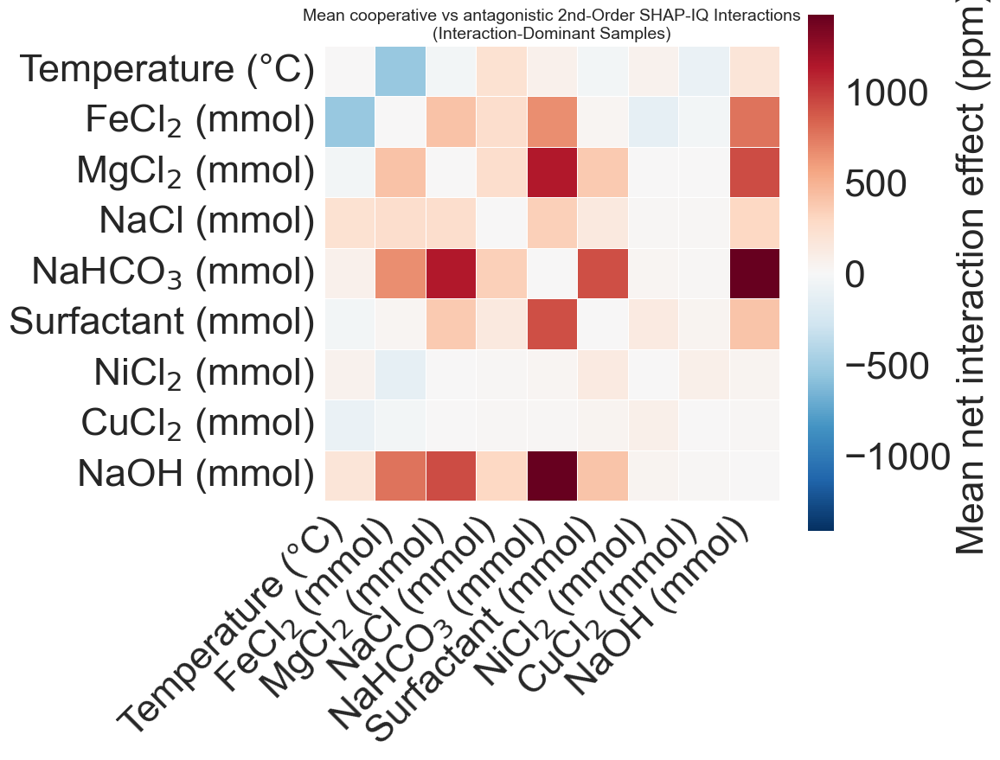

In [ ]:
# Nicely formatted Heatmap of cooperative v antagonistic interactions among interaction-dominant samples

interaction_ratios = []

for interaction_values in all_interaction_values:
    order_1st = interaction_values.get_n_order_values(1)
    order_2nd = interaction_values.get_n_order_values(2)

    total_1st = np.sum(np.abs(order_1st))
    total_2nd = np.sum(np.abs(order_2nd[np.triu_indices_from(order_2nd, k=1)]))

    ratio = total_2nd / total_1st if total_1st != 0 else 0
    interaction_ratios.append(ratio)

interaction_ratios = np.array(interaction_ratios)
dominant_indices = np.where(interaction_ratios > 1)[0]

n_features = len(feature_names_9)
signed_matrix = np.zeros((n_features, n_features))

for idx in dominant_indices:
    interaction_values = all_interaction_values[idx]
    order_2nd = interaction_values.get_n_order_values(2)

    signed_matrix += order_2nd

# Mean across dominant samples
signed_matrix /= len(dominant_indices)

# Zero diagonal
np.fill_diagonal(signed_matrix, 0)


import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,10))

# Symmetric color scaling
vmax = np.max(np.abs(signed_matrix))

sns.heatmap(
    signed_matrix,
    cmap="RdBu_r",
    center=0,
    vmin=-vmax,
    vmax=vmax,
    xticklabels=feature_names_9,
    yticklabels=feature_names_9,
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Mean net interaction effect (ppm)'}
)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.title("Mean cooperative vs antagonistic 2nd-Order SHAP-IQ Interactions\n(Interaction-Dominant Samples)", fontsize=14)
plt.tight_layout()
plt.show()


In [19]:
for idx in [10, 86, 113, 132]:  # zero-indexed
    iv = all_interaction_values[idx]
    o1 = iv.get_n_order_values(1)
    o2 = iv.get_n_order_values(2)

    total_1 = np.sum(np.abs(o1))
    total_2 = np.sum(np.abs(o2[np.triu_indices_from(o2, k=1)]))

    print(f"\nSample {idx+1}")
    print("Total |1st|:", total_1)
    print("Total |2nd|:", total_2)



Sample 11
Total |1st|: 8777.893553720573
Total |2nd|: 16230.606636988512

Sample 87
Total |1st|: 21624.00424210349
Total |2nd|: 50748.14227812038

Sample 114
Total |1st|: 18449.636261397452
Total |2nd|: 35796.3572669037

Sample 133
Total |1st|: 13191.243830415971
Total |2nd|: 11888.296440288703


In [20]:
import numpy as np

def print_top_interactions(sample_number, top_k=3):
    """
    Print top_k signed interactions (largest absolute magnitude)
    for a given sample number (1-indexed).
    """
    
    sample_idx = sample_number - 1  # convert to 0-index
    
    interaction_values = all_interaction_values[sample_idx]
    order_2nd = interaction_values.get_n_order_values(2)
    
    n_features = len(feature_names_9)
    
    # Collect upper triangle interactions
    interactions = []
    
    for i in range(n_features):
        for j in range(i+1, n_features):
            val = order_2nd[i, j]
            interactions.append((abs(val), val, i, j))
    
    # Sort by absolute magnitude descending
    interactions_sorted = sorted(interactions, reverse=True)
    
    print(f"\n=== Sample {sample_number} ===")
    
    for k in range(top_k):
        abs_val, signed_val, i, j = interactions_sorted[k]
        
        sign_label = "Positive synergy" if signed_val > 0 else "Negative antagonism"
        
        print(f"\n{k+1}. {feature_names_9[i]} × {feature_names_9[j]}")
        print(f"   Signed interaction: {signed_val:.2f}")
        print(f"   Absolute magnitude: {abs_val:.2f}")
        print(f"   Interpretation: {sign_label}")



In [22]:
  for s in [11, 87, 114, 133]:
        print_top_interactions(s, top_k=3)



=== Sample 11 ===

1. NaHCO$_3$ (mmol) × NaOH (mmol)
   Signed interaction: 1750.91
   Absolute magnitude: 1750.91
   Interpretation: Positive synergy

2. MgCl$_2$ (mmol) × NaHCO$_3$ (mmol)
   Signed interaction: 1379.98
   Absolute magnitude: 1379.98
   Interpretation: Positive synergy

3. Temperature (°C) × Surfactant (mmol)
   Signed interaction: 1244.36
   Absolute magnitude: 1244.36
   Interpretation: Positive synergy

=== Sample 87 ===

1. NaHCO$_3$ (mmol) × NaOH (mmol)
   Signed interaction: 4574.52
   Absolute magnitude: 4574.52
   Interpretation: Positive synergy

2. NaHCO$_3$ (mmol) × Surfactant (mmol)
   Signed interaction: 3752.82
   Absolute magnitude: 3752.82
   Interpretation: Positive synergy

3. MgCl$_2$ (mmol) × NaHCO$_3$ (mmol)
   Signed interaction: 3581.91
   Absolute magnitude: 3581.91
   Interpretation: Positive synergy

=== Sample 114 ===

1. Temperature (°C) × NaOH (mmol)
   Signed interaction: 5925.77
   Absolute magnitude: 5925.77
   Interpretation: Positive

In [23]:
import numpy as np

predicted_values = []
total_1st_abs = []
total_2nd_abs = []
interaction_ratios = []

for sample_id in range(len(all_interaction_values)):

    interaction_values = all_interaction_values[sample_id]
    
    order_1st = interaction_values.get_n_order_values(1)
    order_2nd = interaction_values.get_n_order_values(2)
    
    # Totals
    first_total = np.sum(np.abs(order_1st))
    second_total = np.sum(np.abs(order_2nd[np.triu_indices_from(order_2nd, k=1)]))
    
    ratio = second_total / first_total if first_total > 0 else 0
    
    # Store
    total_1st_abs.append(first_total)
    total_2nd_abs.append(second_total)
    interaction_ratios.append(ratio)
    
    # Model prediction
    pred = model_predict(X_analysis_gpr[sample_id:sample_id+1])[0]
    predicted_values.append(pred)

# Convert to arrays
predicted_values = np.array(predicted_values)
total_1st_abs = np.array(total_1st_abs)
total_2nd_abs = np.array(total_2nd_abs)
interaction_ratios = np.array(interaction_ratios)

print("Stored all interaction and prediction metrics successfully.")


Stored all interaction and prediction metrics successfully.


In [24]:
from scipy.stats import spearmanr

rho_ratio, p_ratio = spearmanr(predicted_values, interaction_ratios)
rho_2nd, p_2nd = spearmanr(predicted_values, total_2nd_abs)

print("\n=== Correlation with H2 prediction ===")
print(f"Spearman (H2 vs interaction ratio):  rho = {rho_ratio:.3f}, p = {p_ratio:.4g}")
print(f"Spearman (H2 vs |2nd order| total):  rho = {rho_2nd:.3f}, p = {p_2nd:.4g}")



=== Correlation with H2 prediction ===
Spearman (H2 vs interaction ratio):  rho = 0.817, p = 3.908e-33
Spearman (H2 vs |2nd order| total):  rho = 0.637, p = 1.779e-16


In [25]:
# Identify additive-dominant samples
additive_indices = np.where(interaction_ratios <= 1)[0]

print(f"\nNumber of additive-dominant samples: {len(additive_indices)}")

# Compute mean absolute first-order contributions in additive regime
n_features = len(feature_names_9)
first_order_matrix = np.zeros((len(additive_indices), n_features))

for idx_i, sample_idx in enumerate(additive_indices):
    interaction_values = all_interaction_values[sample_idx]
    order_1st = interaction_values.get_n_order_values(1)
    first_order_matrix[idx_i] = np.abs(order_1st)

mean_first_additive = np.mean(first_order_matrix, axis=0)

additive_df = pd.DataFrame({
    "feature": feature_names_9,
    "mean_abs_first_order_additive_regime": mean_first_additive
}).sort_values("mean_abs_first_order_additive_regime", ascending=False)

print("\n==== Additive-Dominant Regime: Feature Influence ====")
print(additive_df)
print("=====================================================")



Number of additive-dominant samples: 76

==== Additive-Dominant Regime: Feature Influence ====
             feature  mean_abs_first_order_additive_regime
4   NaHCO$_3$ (mmol)                           3145.379229
8        NaOH (mmol)                           2090.455966
0   Temperature (°C)                           1845.296458
2    MgCl$_2$ (mmol)                           1798.711809
5  Surfactant (mmol)                           1434.807534
1    FeCl$_2$ (mmol)                           1054.858881
3        NaCl (mmol)                            688.058907
6    NiCl$_2$ (mmol)                            228.641705
7    CuCl$_2$ (mmol)                            146.528249


In [26]:
import numpy as np
import pandas as pd

# Identify interaction-dominant samples
dominant_indices = np.where(np.array(interaction_ratios) > 1)[0]

n_features = len(feature_names_9)
results = []

for i in range(n_features):
    for j in range(i+1, n_features):
        
        signed_vals = []
        
        for idx in dominant_indices:
            order_2nd = all_interaction_values[idx].get_n_order_values(2)
            signed_vals.append(order_2nd[i, j])
        
        signed_vals = np.array(signed_vals)
        
        percent_positive = 100 * np.mean(signed_vals > 0)
        percent_negative = 100 * np.mean(signed_vals < 0)
        
        mean_signed = np.mean(signed_vals)
        mean_abs = np.mean(np.abs(signed_vals))
        
        results.append({
            "pair": f"{feature_names_9[i]} × {feature_names_9[j]}",
            "percent_positive": percent_positive,
            "percent_negative": percent_negative,
            "mean_signed": mean_signed,
            "mean_abs": mean_abs
        })

antagonism_df = pd.DataFrame(results)

# Sort by highest percent negative
antagonism_df = antagonism_df.sort_values("percent_negative", ascending=False)

print("\n=== Most Antagonistic Pairs (Interaction-Dominant Samples) ===")
print(antagonism_df.head(10))

# Also check sign-switching behavior (near 50/50)
switching_df = antagonism_df[
    (antagonism_df["percent_positive"] > 30) &
    (antagonism_df["percent_positive"] < 70)
]

print("\n=== Sign-Switching (Regime-Dependent) Pairs ===")
print(switching_df.sort_values("mean_abs", ascending=False).head(10))



=== Most Antagonistic Pairs (Interaction-Dominant Samples) ===
                                    pair  percent_positive  percent_negative  \
13     FeCl$_2$ (mmol) × CuCl$_2$ (mmol)         31.578947         68.421053   
0     Temperature (°C) × FeCl$_2$ (mmol)         33.333333         66.666667   
12     FeCl$_2$ (mmol) × NiCl$_2$ (mmol)         38.596491         61.403509   
6     Temperature (°C) × CuCl$_2$ (mmol)         38.596491         61.403509   
1     Temperature (°C) × MgCl$_2$ (mmol)         45.614035         54.385965   
3    Temperature (°C) × NaHCO$_3$ (mmol)         49.122807         50.877193   
4   Temperature (°C) × Surfactant (mmol)         49.122807         50.877193   
7         Temperature (°C) × NaOH (mmol)         50.877193         49.122807   
5     Temperature (°C) × NiCl$_2$ (mmol)         52.631579         47.368421   
24         NaCl (mmol) × CuCl$_2$ (mmol)         54.385965         45.614035   

    mean_signed     mean_abs  
13   -42.865363    96.61

Number of interaction-dominant samples: 57


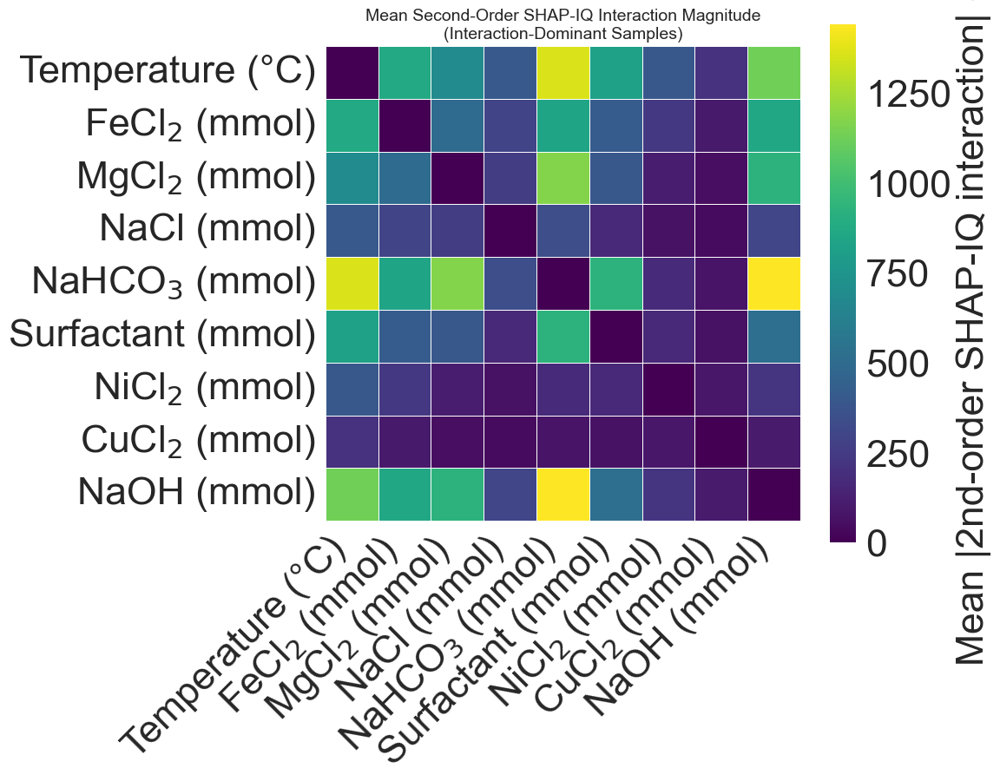

In [27]:
# ==============================
# MEAN ABSOLUTE INTERACTION HEATMAP
# ==============================

interaction_ratios = []

# --- Compute dominance ratio per sample ---
for interaction_values in all_interaction_values:
    order_1st = interaction_values.get_n_order_values(1)
    order_2nd = interaction_values.get_n_order_values(2)

    total_1st = np.sum(np.abs(order_1st))
    total_2nd = np.sum(np.abs(order_2nd[np.triu_indices_from(order_2nd, k=1)]))

    ratio = total_2nd / total_1st if total_1st != 0 else 0
    interaction_ratios.append(ratio)

interaction_ratios = np.array(interaction_ratios)
dominant_indices = np.where(interaction_ratios > 1)[0]

print(f"Number of interaction-dominant samples: {len(dominant_indices)}")

# --- Initialize magnitude matrix ---
n_features = len(feature_names_9)
abs_matrix = np.zeros((n_features, n_features))

# --- Accumulate absolute interaction values ---
for idx in dominant_indices:
    interaction_values = all_interaction_values[idx]
    order_2nd = interaction_values.get_n_order_values(2)

    abs_matrix += np.abs(order_2nd)

# --- Mean across dominant samples ---
abs_matrix /= len(dominant_indices)

# Zero diagonal (no self-interaction)
np.fill_diagonal(abs_matrix, 0)

# ==============================
# PLOT HEATMAP
# ==============================

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,10))

sns.heatmap(
    abs_matrix,
    cmap="viridis",                     # single-direction magnitude scale
    xticklabels=feature_names_9,
    yticklabels=feature_names_9,
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Mean |2nd-order SHAP-IQ interaction| (ppm)'}
)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.title(
    "Mean Second-Order SHAP-IQ Interaction Magnitude\n"
    "(Interaction-Dominant Samples)",
    fontsize=14
)

plt.tight_layout()
plt.show()


### 4.2 Identifying plot samples 

In [28]:
import numpy as np

# Samples to exclude (convert to 0-index)
exclude_samples = [11, 87, 114, 127]
exclude_idx = [s - 1 for s in exclude_samples]


In [29]:
predicted_array = np.array(predicted_values)

mask = np.ones(len(predicted_array), dtype=bool)
mask[exclude_idx] = False

max_h2_idx = np.argmax(predicted_array[mask])
actual_idx = np.where(mask)[0][max_h2_idx]

print("Max H2 sample (excluding chosen):", actual_idx + 1)
print("Predicted H2:", predicted_array[actual_idx])


Max H2 sample (excluding chosen): 91
Predicted H2: 30013.476169071837


In [30]:
interaction_array = np.array(interaction_ratios)

mask = np.ones(len(interaction_array), dtype=bool)
mask[exclude_idx] = False

max_ratio_idx = np.argmax(interaction_array[mask])
actual_idx = np.where(mask)[0][max_ratio_idx]

print("Max interaction ratio sample:", actual_idx + 1)
print("Interaction ratio:", interaction_array[actual_idx])


Max interaction ratio sample: 101
Interaction ratio: 11.673034566808571


In [31]:
median_h2 = np.median(predicted_array)

candidates = []
for i in range(len(predicted_array)):
    if i in exclude_idx:
        continue
    if predicted_array[i] > median_h2 and interaction_array[i] < 1:
        candidates.append((predicted_array[i], i))

# sort by highest H2
candidates = sorted(candidates, reverse=True)

best_additive_idx = candidates[0][1]

print("High H2 additive-dominant sample:", best_additive_idx + 1)
print("Predicted H2:", predicted_array[best_additive_idx])
print("Interaction ratio:", interaction_array[best_additive_idx])


High H2 additive-dominant sample: 76
Predicted H2: 4690.0178671752265
Interaction ratio: 0.9890714492154378


In [32]:
fe_index = feature_names_9.index('FeCl$_2$ (mmol)')


In [33]:
max_fe_strength = 0
max_fe_sample = None

for i in range(len(all_interaction_values)):
    if i in exclude_idx:
        continue
        
    order_2nd = all_interaction_values[i].get_n_order_values(2)
    
    for j in range(len(feature_names_9)):
        if j == fe_index:
            continue
        
        val = abs(order_2nd[fe_index, j])
        if val > max_fe_strength:
            max_fe_strength = val
            max_fe_sample = i

print("Strongest FeCl2 interaction sample:", max_fe_sample + 1)
print("Interaction strength:", max_fe_strength)


Strongest FeCl2 interaction sample: 128
Interaction strength: 4452.990057803337


In [34]:
most_negative = 0
most_negative_sample = None

for i in range(len(all_interaction_values)):
    if i in exclude_idx:
        continue
        
    order_2nd = all_interaction_values[i].get_n_order_values(2)
    min_val = np.min(order_2nd)
    
    if min_val < most_negative:
        most_negative = min_val
        most_negative_sample = i

print("Strongest antagonistic sample:", most_negative_sample + 1)
print("Most negative interaction:", most_negative)


Strongest antagonistic sample: 128
Most negative interaction: -4452.990057803337


In [35]:
mask = np.ones(len(predicted_array), dtype=bool)
mask[exclude_idx] = False

min_h2_idx = np.argmin(predicted_array[mask])
actual_idx = np.where(mask)[0][min_h2_idx]

print("Lowest H2 sample:", actual_idx + 1)
print("Predicted H2:", predicted_array[actual_idx])


Lowest H2 sample: 124
Predicted H2: 0.42351575363253413


In [36]:
target_ratio = 0.9  # near median
idx = np.argmin(np.abs(interaction_ratios - target_ratio))
print(idx+1, interaction_ratios[idx], predicted_values[idx])


84 0.9006661283154103 787.7145860401048


*Extra analysis to assess the temperature-dependent banding observed in temperature-containing partial dependence plots

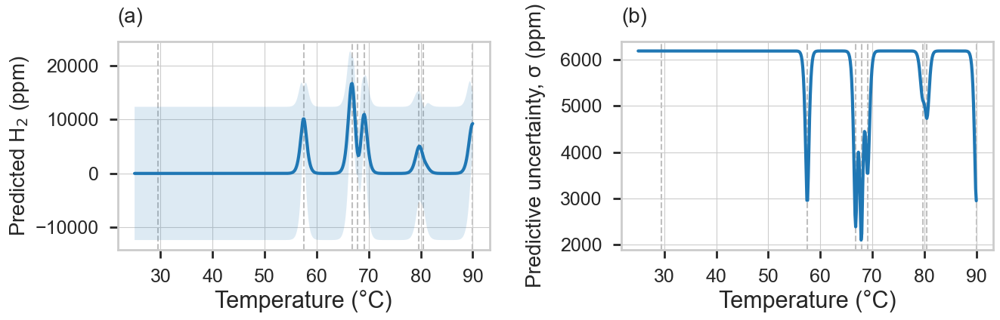

In [6]:
# One-dimensional Gaussian process predictions along the temperature dimension with all remaining variables fixed at anchor values. 

# ==========================================================
# Figure Sx
# Temperature dependence and uncertainty
# ==========================================================

load_plt_setting()

output_folder = '/Users/nickyevans17/Library/CloudStorage/OneDrive-MassachusettsInstituteofTechnology/PostDoc_MIT_2024-/Collaboration work (Sept 2025 -/Abhishek_Abate_Catalysis work - Sept 2025/Figures for paper/'


TEMP_IDX = 0

# ----------------------------------------------------------
# Temperature grid
# ----------------------------------------------------------

temp_grid = np.linspace(0, 1, 500)

x_ref = np.median(X_train, axis=0)

X_eval = np.tile(
    x_ref,
    (len(temp_grid), 1)
)

X_eval[:, TEMP_IDX] = temp_grid

Y_pred, Y_var = model_gpy.predict(X_eval)

Y_pred = Y_pred.flatten()
Y_std  = np.sqrt(Y_var.flatten())

temp_C = temp_grid * 65 + 25

observed_temp_C = np.unique(
    X_train[:, TEMP_IDX]
) * 65 + 25


# ----------------------------------------------------------
# Figure
# ----------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 5)
)

# ==========================================================
# Panel A
# ==========================================================

ax = axes[0]

ax.plot(
    temp_C,
    Y_pred,
    linewidth=3
)

ax.fill_between(
    temp_C,
    Y_pred - 2*Y_std,
    Y_pred + 2*Y_std,
    alpha=0.15
)

# observed temperatures
for t in observed_temp_C:
    ax.axvline(
        t,
        linestyle='--',
        linewidth=1.5,
        color='black',
        alpha=0.25,
        zorder=-10
    )

ax.set_xlabel(
    'Temperature (°C)',
    fontsize=22
)

ax.set_ylabel(
    'Predicted H$_2$ (ppm)',
    fontsize=20
)

ax.set_title(
    '(a)',
    fontsize=20,
    loc='left',
    pad=18
)

ax.xaxis.set_major_locator(
   mpl.ticker.MultipleLocator(10)
)

ax.tick_params(
    axis='both',
    direction='out',
    length=8,
    width=2,
    pad=10,
    labelsize=18
)

# ==========================================================
# Panel B
# ==========================================================

ax = axes[1]

ax.plot(
    temp_C,
    Y_std,
    linewidth=3
)

for t in observed_temp_C:
    ax.axvline(
        t,
        linestyle='--',
        linewidth=1.5,
        color='black',
        alpha=0.25,
        zorder=-10
    )

ax.set_xlabel(
    'Temperature (°C)',
    fontsize=22
)

ax.set_ylabel(
    'Predictive uncertainty, σ (ppm)',
    fontsize=20,
    labelpad=14
)

ax.set_title(
    '(b)',
    fontsize=20,
    loc='left',
    pad=18
)

ax.xaxis.set_major_locator(
    mpl.ticker.MultipleLocator(10)
)

ax.tick_params(
    axis='both',
    direction='out',
    length=8,
    width=2,
    pad=10,
    labelsize=18
)

# ----------------------------------------------------------
# Layout
# ----------------------------------------------------------

plt.tight_layout()

plt.savefig(
    os.path.join(
        output_folder,
        'Figure_SI_Temperature_Diagnostics.tiff'
    ),
    dpi=600,
    bbox_inches='tight'
)

plt.show()